In [1]:
import pandas_datareader as web
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

assets = ['TSLA', 'TM', 'TSM', 'NVDA', 'PFE', 'JNJ']
start_date = '30-11-2011'
end_date = '30-11-2021'

# funzione utilizzata per scaricare i dati da Yahoo! Finance in unico DataFrame
DF = web.get_data_yahoo(assets, start_date, end_date)

# presentazione delle prime righe del DataFrame su base giornaliera
DF.head()

Attributes Adj Close                                                       \
Symbols         TSLA         TM       TSM      NVDA        PFE        JNJ   
Date                                                                        
2011-11-30     6.548  57.942169  9.481143  3.589470  13.128358  48.787228   
2011-12-01     6.520  57.775139  9.693959  3.633104  13.102197  48.583691   
2011-12-02     6.660  58.214699  9.627912  3.610138  13.010618  47.844959   
2011-12-05     6.884  59.823471  9.701295  3.555023  12.977911  47.762032   
2011-12-06     6.974  58.997105  9.495822  3.504499  13.233019  47.860027   

Attributes  Close                            ...   Open                     \
Symbols      TSLA         TM    TSM    NVDA  ...    TSM    NVDA        PFE   
Date                                         ...                             
2011-11-30  6.548  65.910004  12.92  3.9075  ...  12.77  3.8400  18.557875   
2011-12-01  6.520  65.720001  13.21  3.9550  ...  12.95  3.8750  19.003796   
2011-12-02  6.660  66.220001  13.12  3.9300  ...  13.24  3.9975  19.098673   
2011-12-05  6.884  68.050003  13.22  3.8700  ...  13.27  3.9950  19.089184   
2011-12-06  6.974  67.110001  12.94  3.8150  ...  13.05  3.8925  19.060720   

Attributes                Volume                                    \
Symbols           JNJ       TSLA        TM         TSM        NVDA   
Date                                                                 
2011-11-30  63.919998  3801500.0  830900.0  18986100.0  73032400.0   
2011-12-01  64.680000  5151000.0  449900.0  11239500.0  52976000.0   
2011-12-02  64.870003  4014000.0  461200.0   8691500.0  54646400.0   
2011-12-05  64.099998  5800500.0  905700.0  15855000.0  64469600.0   
2011-12-06  63.610001  4759000.0  593900.0  13573800.0  57383200.0   

Attributes                          
Symbols            PFE         JNJ  
Date                                
2011-11-30  76779895.0  15032600.0  
2011-12-01  45119527.0   9852700.0  
2011-12-02  44988093.0  15792800.0  
2011-12-05  50895236.0  15294500.0  
2011-12-06  55653835.0  10417800.0  

[5 rows x 36 columns]

In [2]:
# salvataggio delle serie di prezzi su base mensile
DF_monthly = DF.groupby(pd.Grouper(freq='M')).mean()
# presentazione delle prime righe del DataFrame su base mensile
DF_monthly.head()

Attributes Adj Close                                                        \
Symbols         TSLA         TM        TSM      NVDA        PFE        JNJ   
Date                                                                         
2011-11-30  6.548000  57.942169   9.481143  3.589470  13.128358  48.787228   
2011-12-31  5.996000  57.719881   9.455286  3.292890  13.698698  48.566822   
2012-01-31  5.498000  61.707397  10.098301  3.309179  14.234820  49.235743   
2012-02-29  6.552400  71.257176  10.465585  3.633678  13.994386  49.094376   
2012-03-31  7.048182  73.870006  10.899448  3.397293  14.433660  49.433866   

Attributes     Close                                  ...       Open  \
Symbols         TSLA         TM        TSM      NVDA  ...        TSM   
Date                                                  ...              
2011-11-30  6.548000  65.910004  12.920000  3.907500  ...  12.770000   
2011-12-31  5.996000  65.657143  12.884762  3.584643  ...  12.889048   
2012-01-31  5.498000  70.193000  13.761000  3.602375  ...  13.713500   
2012-02-29  6.552400  81.056000  14.261500  3.955625  ...  14.238000   
2012-03-31  7.048182  83.896818  14.852727  3.698295  ...  14.851818   

Attributes                                        Volume                 \
Symbols         NVDA        PFE        JNJ          TSLA             TM   
Date                                                                      
2011-11-30  3.840000  18.557875  63.919998  3.801500e+06  830900.000000   
2011-12-31  3.612143  19.829674  64.513809  5.030595e+06  466880.952381   
2012-01-31  3.595875  20.672676  65.275500  6.402475e+06  517825.000000   
2012-02-29  3.947750  20.071157  65.092501  5.798400e+06  628220.000000   
2012-03-31  3.700114  20.657668  64.953181  5.037159e+06  453586.363636   

Attributes                                                          
Symbols              TSM          NVDA           PFE           JNJ  
Date                                                                
2011-11-30  1.898610e+07  7.303240e+07  7.677990e+07  1.503260e+07  
2011-12-31  1.029840e+07  4.639210e+07  4.567153e+07  1.001358e+07  
2012-01-31  1.088514e+07  5.798334e+07  4.997614e+07  1.060680e+07  
2012-02-29  9.112140e+06  6.539148e+07  3.533517e+07  9.618500e+06  
2012-03-31  6.970582e+06  4.693293e+07  3.693799e+07  9.461995e+06  

[5 rows x 36 columns]

In [3]:
# salvataggio delle serie di prezzi "Adjusted Close" mensili
DF_monthly = DF_monthly['Adj Close']
# presentazione delle prime righe delle serie di prezzi "Adjusted Close" mensili
DF_monthly.head()

Symbols,TSLA,TM,TSM,NVDA,PFE,JNJ
Date,,,,,,
2011-11-30,6.548000,57.942169,9.481143,3.589470,13.128358,48.787228
2011-12-31,5.996000,57.719881,9.455286,3.292890,13.698698,48.566822
2012-01-31,5.498000,61.707397,10.098301,3.309179,14.234820,49.235743
2012-02-29,6.552400,71.257176,10.465585,3.633678,13.994386,49.094376
2012-03-31,7.048182,73.870006,10.899448,3.397293,14.433660,49.433866


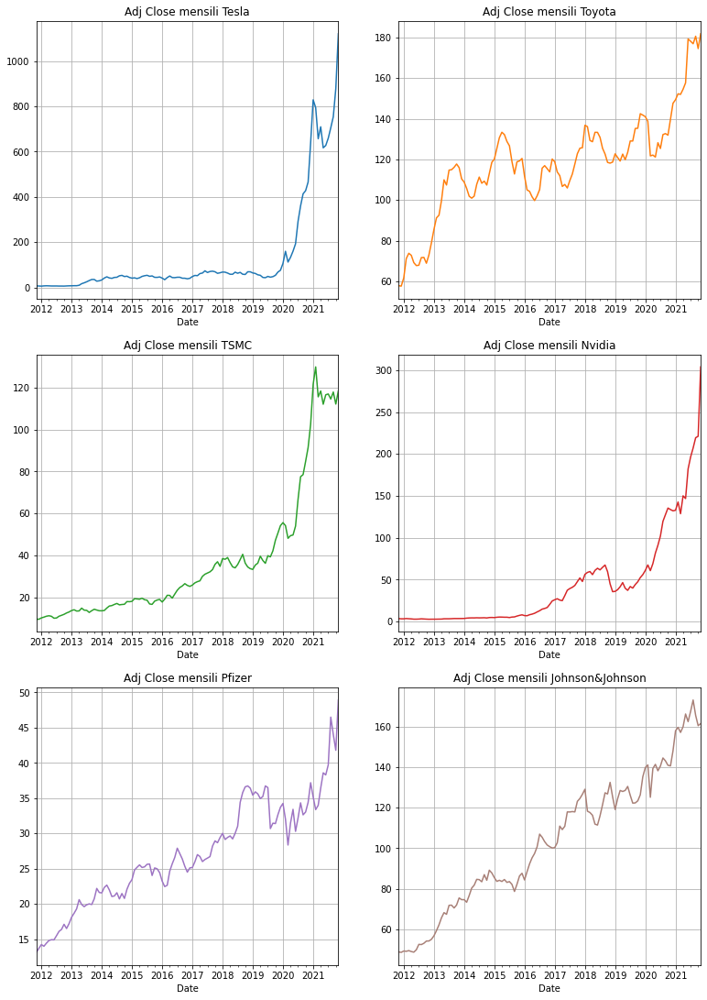

In [4]:
# presentazione degli Adjusted Close mensili in grafici singoli
plt.figure(figsize=(13, 39))
plt.subplot(621)
DF_monthly["TSLA"].plot(grid = True, title = "Adj Close mensili Tesla")
plt.subplot(622)
DF_monthly["TM"].plot(grid = True, title = "Adj Close mensili Toyota", color = "#ff7f0e")
plt.subplot(623)
DF_monthly["TSM"].plot(grid = True, title = "Adj Close mensili TSMC", color = "#2ca02c")
plt.subplot(624)
DF_monthly["NVDA"].plot(grid = True, title = "Adj Close mensili Nvidia", color = "#d62728")
plt.subplot(625)
DF_monthly["PFE"].plot(grid = True, title = "Adj Close mensili Pfizer", color = "#9d74c3")
plt.subplot(626)
DF_monthly["JNJ"].plot(grid = True, title = "Adj Close mensili Johnson&Johnson", color = "#a88077");

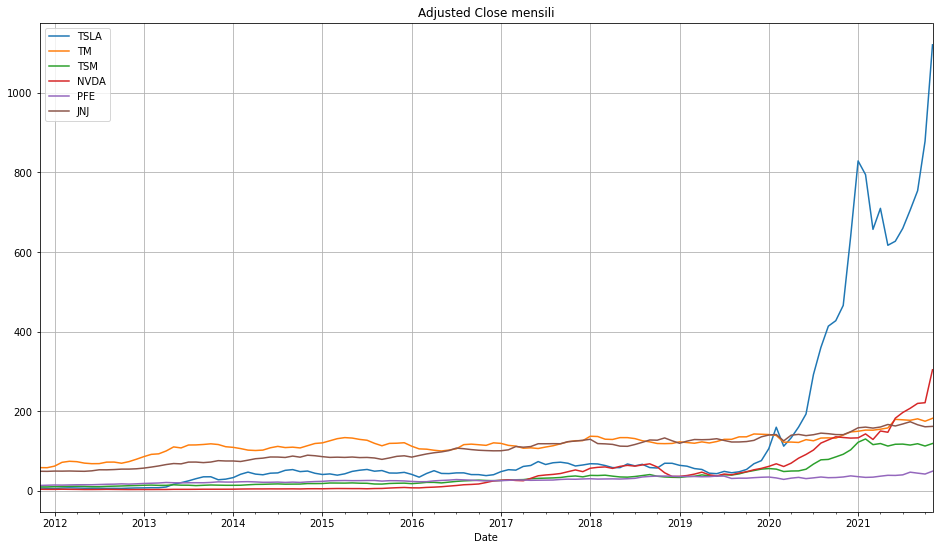

In [5]:
# presentazione degli Adjusted Close mensili in un solo grafico
DF_monthly.columns = assets
DF_monthly.plot(grid = True, title = "Adjusted Close mensili", figsize=(16,9));

In [6]:
# calcolo dei rendimenti semplici mensili
DF_monthlyRS = DF_monthly.pct_change(1)
DF_monthlyRS = DF_monthlyRS.dropna()

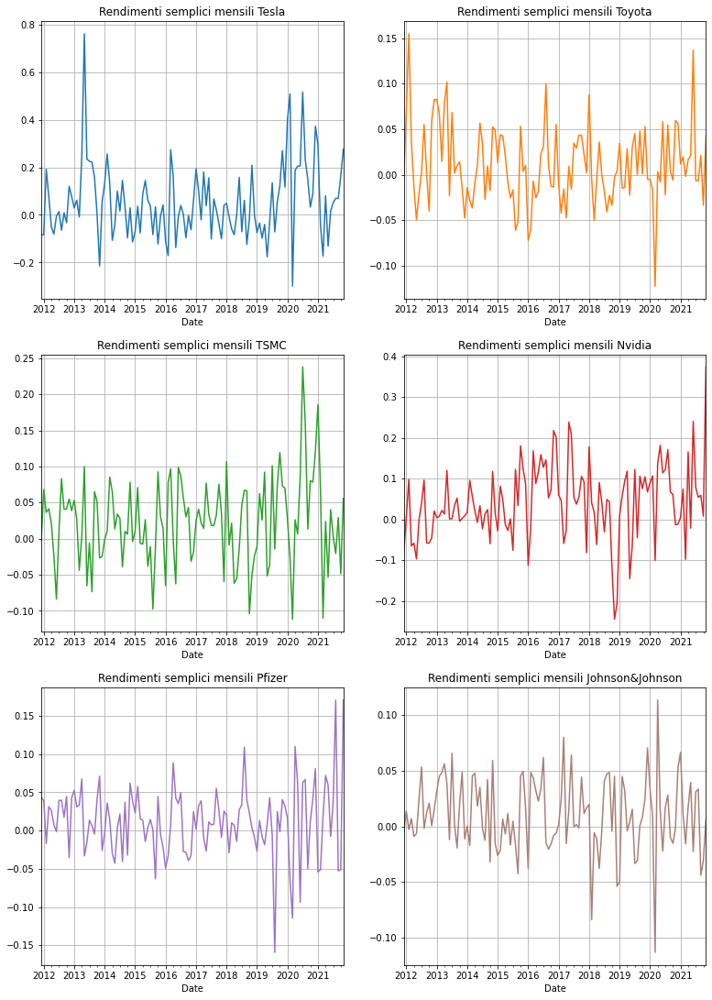

In [7]:
# presentazione dei rendimenti semplici mensili in grafici singoli
plt.figure(figsize=(13, 39))
plt.subplot(621)
DF_monthlyRS["TSLA"].plot(grid = True, title = "Rendimenti semplici mensili Tesla")
plt.subplot(622)
DF_monthlyRS["TM"].plot(grid = True, title = "Rendimenti semplici mensili Toyota", color = "#ff7f0e")
plt.subplot(623)
DF_monthlyRS["TSM"].plot(grid = True, title = "Rendimenti semplici mensili TSMC", color = "#2ca02c")
plt.subplot(624)
DF_monthlyRS["NVDA"].plot(grid = True, title = "Rendimenti semplici mensili Nvidia", color = "#d62728")
plt.subplot(625)
DF_monthlyRS["PFE"].plot(grid = True, title = "Rendimenti semplici mensili Pfizer", color = "#9d74c3")
plt.subplot(626)
DF_monthlyRS["JNJ"].plot(grid = True, title = "Rendimenti semplici mensili Johnson&Johnson", color = "#a88077");

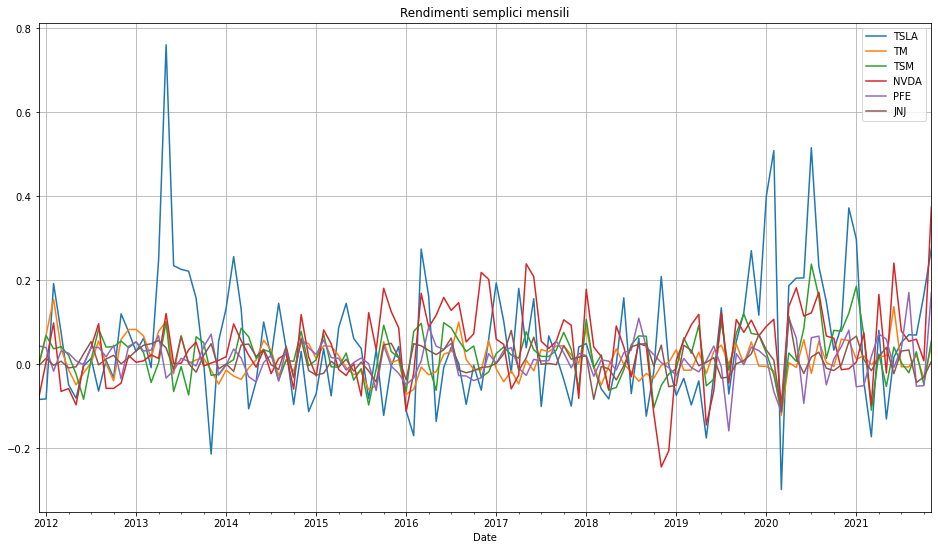

In [8]:
# presentazione dei rendimenti semplici mensili in un solo grafico
DF_monthlyRS.columns = assets
DF_monthlyRS.plot(grid = True, title = "Rendimenti semplici mensili", figsize=(16,9));

In [9]:
# calcolo rendimenti composti mensili
DF_monthlyRC = np.cumprod(1 + DF_monthlyRS)

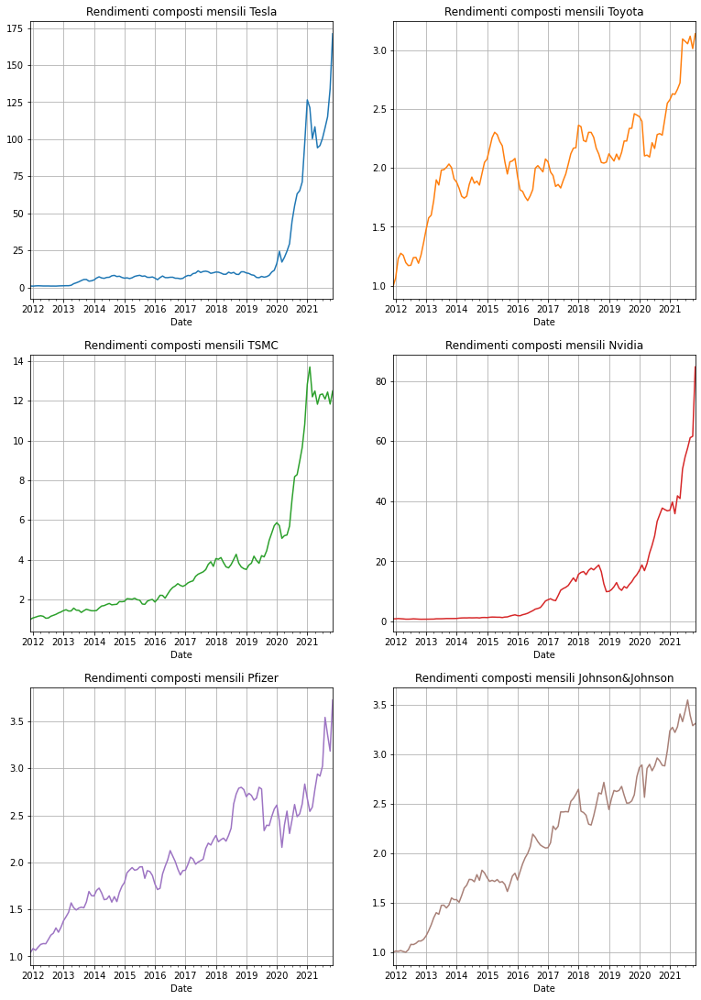

In [10]:
# presentazione dei rendimenti composti mensili in grafici singoli
plt.figure(figsize=(13, 39))
plt.subplot(621)
DF_monthlyRC["TSLA"].plot(grid = True, title = "Rendimenti composti mensili Tesla")
plt.subplot(622)
DF_monthlyRC["TM"].plot(grid = True, title = "Rendimenti composti mensili Toyota", color = "#ff7f0e")
plt.subplot(623)
DF_monthlyRC["TSM"].plot(grid = True, title = "Rendimenti composti mensili TSMC", color = "#2ca02c")
plt.subplot(624)
DF_monthlyRC["NVDA"].plot(grid = True, title = "Rendimenti composti mensili Nvidia", color = "#d62728")
plt.subplot(625)
DF_monthlyRC["PFE"].plot(grid = True, title = "Rendimenti composti mensili Pfizer", color = "#9d74c3")
plt.subplot(626)
DF_monthlyRC["JNJ"].plot(grid = True, title = "Rendimenti composti mensili Johnson&Johnson", color = "#a88077");

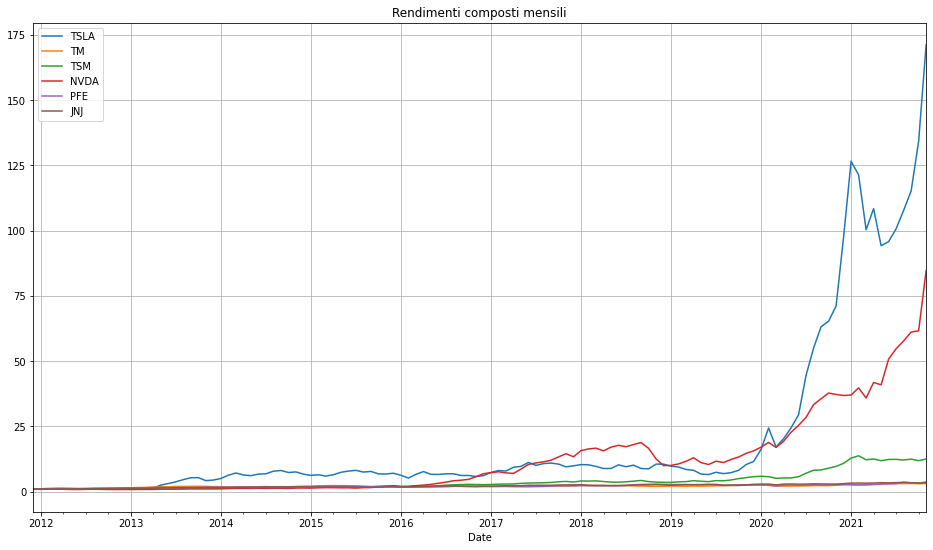

In [11]:
# presentazione dei rendimenti composti mensili in un solo grafico
DF_monthlyRC.columns = assets
DF_monthlyRC.plot(grid = True, title = "Rendimenti composti mensili", figsize=(16,9));

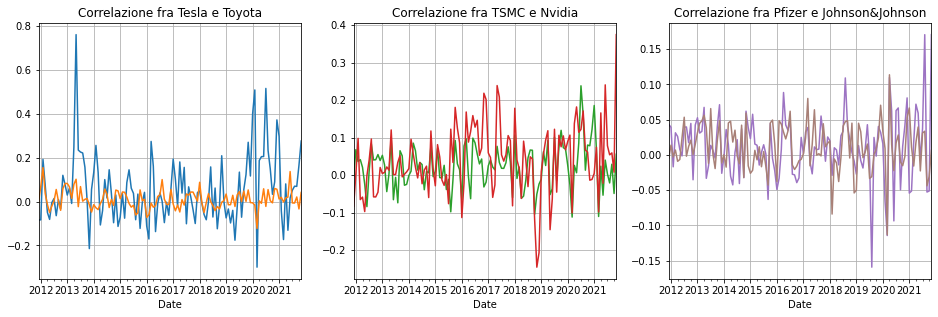

In [12]:
# presentazione dei rendimenti tra società dello stesso settore
plt.figure(figsize=(16, 16))
plt.subplot(331)
DF_monthlyRS["TSLA"].plot(grid = True)
DF_monthlyRS["TM"].plot(grid = True, color = "#ff7f0e")
plt.title("Correlazione fra Tesla e Toyota");
plt.subplot(332)
DF_monthlyRS["TSM"].plot(grid = True, color = "#2ca02c")
DF_monthlyRS["NVDA"].plot(grid = True, color = "#d62728")
plt.title("Correlazione fra TSMC e Nvidia");
plt.subplot(333)
DF_monthlyRS["PFE"].plot(grid = True, color = "#9d74c3")
DF_monthlyRS["JNJ"].plot(grid = True, color = "#a88077")
plt.title("Correlazione fra Pfizer e Johnson&Johnson");

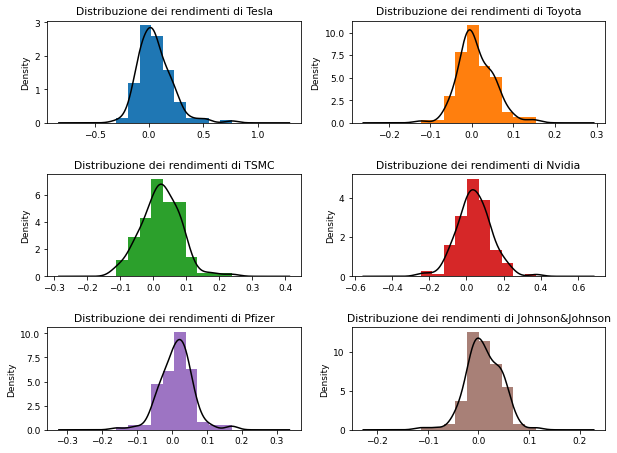

In [13]:
# presentazione dei rendimenti con istogrammi e della propria distribuzione
plt.figure(figsize=(10, 16))
plt.rc('font', size=9)
plt.tight_layout()
plt.subplots_adjust(hspace=0.5)

plt.subplot(621)
plt.hist(DF_monthlyRS["TSLA"], density = True)
plt.title('Distribuzione dei rendimenti di Tesla')
DF_monthlyRS["TSLA"].plot.density(color = "black")

plt.subplot(622)
plt.hist(DF_monthlyRS["TM"], density = True, color = "#ff7f0e")
plt.title('Distribuzione dei rendimenti di Toyota')
DF_monthlyRS["TM"].plot.density(color = "black")

plt.subplot(623)
plt.hist(DF_monthlyRS["TSM"], density = True, color = "#2ca02c")
plt.title('Distribuzione dei rendimenti di TSMC')
DF_monthlyRS["TSM"].plot.density(color = "black")

plt.subplot(624)
plt.hist(DF_monthlyRS["NVDA"], density = True, color = "#d62728")
plt.title('Distribuzione dei rendimenti di Nvidia')
DF_monthlyRS["NVDA"].plot.density(color = "black")

plt.subplot(625)
plt.hist(DF_monthlyRS["PFE"], density = True, color = "#9d74c3")
plt.title('Distribuzione dei rendimenti di Pfizer')
DF_monthlyRS["PFE"].plot.density(color = "black")

plt.subplot(626)
plt.hist(DF_monthlyRS["JNJ"], density = True, color = "#a88077")
plt.title('Distribuzione dei rendimenti di Johnson&Johnson')
DF_monthlyRS["JNJ"].plot.density(color = "black");

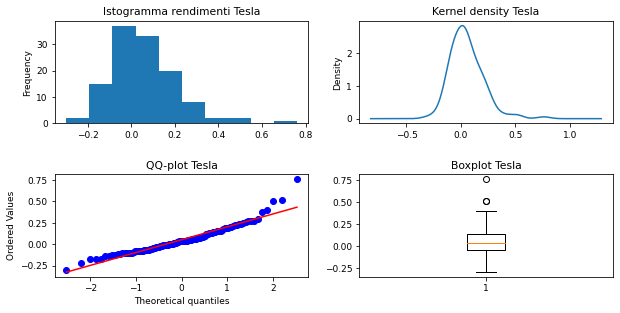

In [14]:
# grafici diagnostici a 4 sezioni per la serie di rendimenti di Tesla
plt.figure(figsize=(10, 16))
plt.rc('font', size=9)
plt.tight_layout()
plt.subplots_adjust(hspace=0.5)

plt.subplot(621)
DF_monthlyRS["TSLA"].plot(kind = "hist", title = 'Istogramma rendimenti Tesla')

plt.subplot(622)
plt.title('Kernel density Tesla')
DF_monthlyRS["TSLA"].plot.density()

plt.subplot(623)
stats.probplot(DF_monthlyRS["TSLA"], dist = "norm", plot = plt)
plt.title('QQ-plot Tesla')

plt.subplot(624)
plt.boxplot(DF_monthlyRS["TSLA"])
plt.title("Boxplot Tesla");

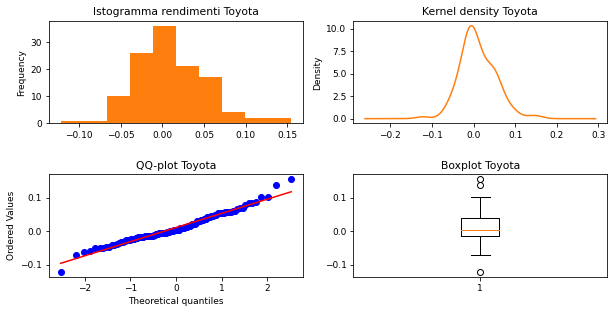

In [15]:
# grafici diagnostici a 4 sezioni per la serie di rendimenti di Toyota
plt.figure(figsize=(10, 16))
plt.rc('font', size=9)
plt.tight_layout()
plt.subplots_adjust(hspace=0.5)

plt.subplot(621)
DF_monthlyRS["TM"].plot(kind = "hist", title = 'Istogramma rendimenti Toyota', color = "#ff7f0e")

plt.subplot(622)
plt.title('Kernel density Toyota')
DF_monthlyRS["TM"].plot.density(color = "#ff7f0e")

plt.subplot(623)
stats.probplot(DF_monthlyRS["TM"], dist = "norm", plot = plt)
plt.title('QQ-plot Toyota')

plt.subplot(624)
plt.boxplot(DF_monthlyRS["TM"])
plt.title("Boxplot Toyota");

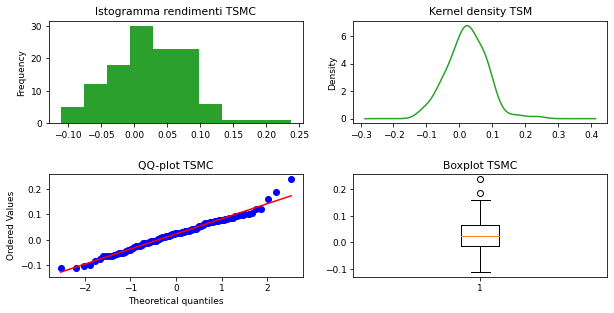

In [16]:
# grafici diagnostici a 4 sezioni per la serie di rendimenti di TSMC
plt.figure(figsize=(10, 16))
plt.rc('font', size=9)
plt.tight_layout()
plt.subplots_adjust(hspace=0.5)

plt.subplot(621)
DF_monthlyRS["TSM"].plot(kind = "hist", title = 'Istogramma rendimenti TSMC', color = "#2ca02c")

plt.subplot(622)
plt.title('Kernel density TSM')
DF_monthlyRS["TSM"].plot.density(color = "#2ca02c")

plt.subplot(623)
#sm.qqplot(DF_monthlyRSlog["TM"], line = 's')
stats.probplot(DF_monthlyRS["TSM"], dist = "norm", plot = plt)
plt.title('QQ-plot TSMC')

plt.subplot(624)
plt.boxplot(DF_monthlyRS["TSM"])
plt.title("Boxplot TSMC");

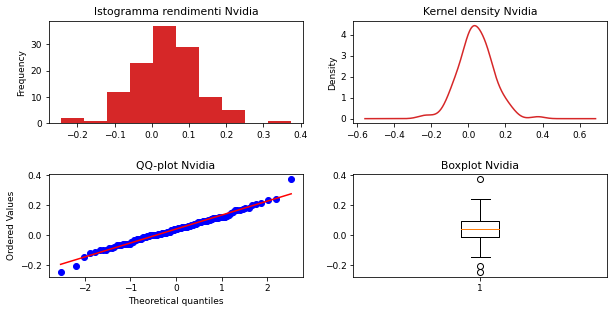

In [17]:
# grafici diagnostici a 4 sezioni per la serie di rendimenti di Nvidia
plt.figure(figsize=(10, 16))
plt.rc('font', size=9)
plt.tight_layout()
plt.subplots_adjust(hspace=0.5)

plt.subplot(621)
DF_monthlyRS["NVDA"].plot(kind = "hist", title = 'Istogramma rendimenti Nvidia', color = "#d62728")

plt.subplot(622)
plt.title('Kernel density Nvidia')
DF_monthlyRS["NVDA"].plot.density(color = "#d62728")

plt.subplot(623)
#sm.qqplot(DF_monthlyRSlog["TM"], line = 's')
stats.probplot(DF_monthlyRS["NVDA"], dist = "norm", plot = plt)
plt.title('QQ-plot Nvidia')

plt.subplot(624)
plt.boxplot(DF_monthlyRS["NVDA"])
plt.title("Boxplot Nvidia");

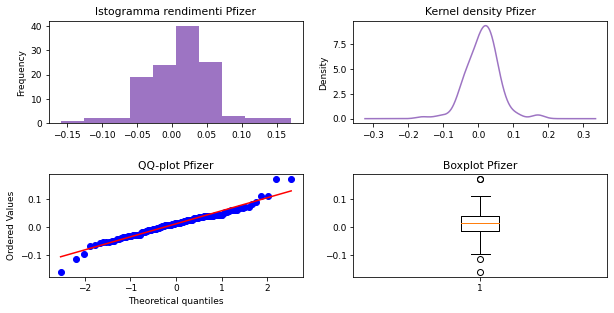

In [18]:
# grafici diagnostici a 4 sezioni per la serie di rendimenti di Pfizer
plt.figure(figsize=(10, 16))
plt.rc('font', size=9)
plt.tight_layout()
plt.subplots_adjust(hspace=0.5)

plt.subplot(621)
DF_monthlyRS["PFE"].plot(kind = "hist", title = 'Istogramma rendimenti Pfizer', color = "#9d74c3")

plt.subplot(622)
plt.title('Kernel density Pfizer')
DF_monthlyRS["PFE"].plot.density(color = "#9d74c3")

plt.subplot(623)
#sm.qqplot(DF_monthlyRSlog["TM"], line = 's')
stats.probplot(DF_monthlyRS["PFE"], dist = "norm", plot = plt)
plt.title('QQ-plot Pfizer')

plt.subplot(624)
plt.boxplot(DF_monthlyRS["PFE"])
plt.title("Boxplot Pfizer");

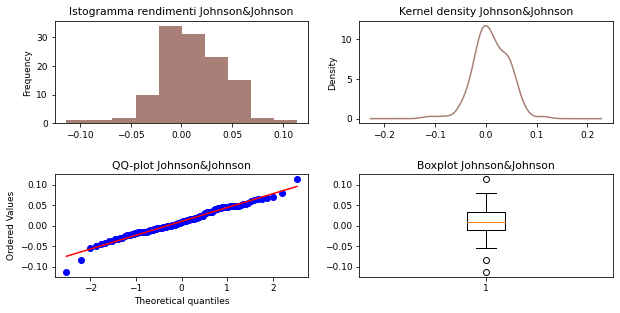

In [19]:
# grafici diagnostici a 4 sezioni per la serie di rendimenti di Johnson&Johnson
plt.figure(figsize=(10, 16))
plt.rc('font', size=9)
plt.tight_layout()
plt.subplots_adjust(hspace=0.5)

plt.subplot(621)
DF_monthlyRS["JNJ"].plot(kind = "hist", title = 'Istogramma rendimenti Johnson&Johnson', color = "#a88077")

plt.subplot(622)
plt.title('Kernel density Johnson&Johnson')
DF_monthlyRS["JNJ"].plot.density(color = "#a88077")

plt.subplot(623)
#sm.qqplot(DF_monthlyRSlog["TM"], line = 's')
stats.probplot(DF_monthlyRS["JNJ"], dist = "norm", plot = plt)
plt.title('QQ-plot Johnson&Johnson')

plt.subplot(624)
plt.boxplot(DF_monthlyRS["JNJ"])
plt.title("Boxplot Johnson&Johnson");

In [20]:
# Statistiche descrittive univariate: Tesla
print("Tesla")

mediaTesla = round(DF_monthlyRS["TSLA"].mean(), 4)
print("Media: ", mediaTesla)

varianzaTesla = round(DF_monthlyRS["TSLA"].var(), 4)
print("Varianza: ", varianzaTesla)

dsTesla = round(DF_monthlyRS["TSLA"].std(), 4)
print("Deviazione standard: ", dsTesla)

asimTesla = round(DF_monthlyRS["TSLA"].skew(), 4)
print("Asimmetria: ", asimTesla)

kTesla = round(DF_monthlyRS["TSLA"].kurtosis(), 4)
print("Kurtosi: ", kTesla)

Tesla
Media:  0.0541
Varianza:  0.0237
Deviazione standard:  0.1541
Asimmetria:  1.2628
Kurtosi:  3.5872


In [21]:
# Statistiche descrittive univariate: Toyota
print("Toyota")

mediaToyota = round(DF_monthlyRS["TM"].mean(), 4)
print("Media: ", mediaToyota)

varianzaToyota = round(DF_monthlyRS["TM"].var(), 4)
print("Varianza: ", varianzaToyota)

dsToyota = round(DF_monthlyRS["TM"].std(), 4)
print("Deviazione standard: ", dsToyota)

asimToyota = round(DF_monthlyRS["TM"].skew(), 4)
print("Asimmetria: ", asimToyota)

kToyota = round(DF_monthlyRS["TM"].kurtosis(), 4)
print("Kurtosi: ", kToyota)

Toyota
Media:  0.0104
Varianza:  0.0018
Deviazione standard:  0.0423
Asimmetria:  0.4476
Kurtosi:  1.2126


In [22]:
# Statistiche descrittive univariate: TSMC
print("TSMC")

mediaTSMC = round(DF_monthlyRS["TSM"].mean(), 4)
print("Media: ", mediaTSMC)

varianzaTSMC = round(DF_monthlyRS["TSM"].var(), 4)
print("Varianza: ", varianzaTSMC)

dsTSMC = round(DF_monthlyRS["TSM"].std(), 4)
print("Deviazione standard: ", dsTSMC)

asimTSMC = round(DF_monthlyRS["TSM"].skew(), 4)
print("Asimmetria: ", asimTSMC)

kTSMC = round(DF_monthlyRS["TSM"].kurtosis(), 4)
print("Kurtosi: ", kTSMC)

TSMC
Media:  0.023
Varianza:  0.0035
Deviazione standard:  0.0591
Asimmetria:  0.2774
Kurtosi:  1.0156


In [23]:
# Statistiche descrittive univariate: Nvidia
print("Nvidia")

mediaNvidia = round(DF_monthlyRS["NVDA"].mean(), 4)
print("Media: ", mediaNvidia)

varianzaNvidia = round(DF_monthlyRS["NVDA"].var(), 4)
print("Varianza: ", varianzaNvidia)

dsNvidia = round(DF_monthlyRS["NVDA"].std(), 4)
print("Deviazione standard: ", dsNvidia)

asimNvidia = round(DF_monthlyRS["NVDA"].skew(), 4)
print("Asimmetria: ", asimNvidia)

kNvidia = round(DF_monthlyRS["NVDA"].kurtosis(), 4)
print("Kurtosi: ", kNvidia)

Nvidia
Media:  0.0418
Varianza:  0.0086
Deviazione standard:  0.0927
Asimmetria:  0.1212
Kurtosi:  1.3015


In [24]:
# Statistiche descrittive univariate: Pfizer
print("Pfizer")

mediaPfizer = round(DF_monthlyRS["PFE"].mean(), 4)
print("Media: ", mediaPfizer)

varianzaPfizer = round(DF_monthlyRS["PFE"].var(), 4)
print("Varianza: ", varianzaPfizer)

dsPfizer = round(DF_monthlyRS["PFE"].std(), 4)
print("Deviazione standard: ", dsPfizer)

asimPfizer = round(DF_monthlyRS["PFE"].skew(), 4)
print("Asimmetria: ", asimPfizer)

kPfizer = round(DF_monthlyRS["PFE"].kurtosis(), 4)
print("Kurtosi: ", kPfizer)

Pfizer
Media:  0.0121
Varianza:  0.0022
Deviazione standard:  0.0468
Asimmetria:  0.0313
Kurtosi:  2.5821


In [25]:
# Statistiche descrittive univariate: Johnson & Johnson
print("Johnson & Johnson")

mediaJNJ = round(DF_monthlyRS["JNJ"].mean(), 4)
print("Media: ", mediaJNJ)

varianzaJNJ = round(DF_monthlyRS["JNJ"].var(), 4)
print("Varianza: ", varianzaJNJ)

dsJNJ = round(DF_monthlyRS["JNJ"].std(), 4)
print("Deviazione standard: ", dsJNJ)

asimJNJ = round(DF_monthlyRS["JNJ"].skew(), 4)
print("Asimmetria: ", asimJNJ)

kJNJ = round(DF_monthlyRS["JNJ"].kurtosis(), 4)
print("Kurtosi: ", kJNJ)

Johnson & Johnson
Media:  0.0106
Varianza:  0.0011
Deviazione standard:  0.0338
Asimmetria:  -0.2365
Kurtosi:  1.2175


In [26]:
# matrice di varianze/covarianze dei rendimenti
DF_monthlyRS.cov()

,TSLA,TM,TSM,NVDA,PFE,JNJ
TSLA,0.023740,0.001489,0.003231,0.004097,0.000661,0.001156
TM,0.001489,0.001790,0.000949,0.001308,0.000337,0.000210
TSM,0.003231,0.000949,0.003497,0.002361,0.000440,0.000695
NVDA,0.004097,0.001308,0.002361,0.008585,0.000853,0.000553
PFE,0.000661,0.000337,0.000440,0.000853,0.002190,0.000791
JNJ,0.001156,0.000210,0.000695,0.000553,0.000791,0.001139


In [27]:
# matrice di correlazione dei rendimenti
DF_monthlyRS.corr()

,TSLA,TM,TSM,NVDA,PFE,JNJ
TSLA,1.000000,0.228405,0.354634,0.287010,0.091719,0.222303
TM,0.228405,1.000000,0.379495,0.333575,0.170357,0.146838
TSM,0.354634,0.379495,1.000000,0.430979,0.158837,0.348402
NVDA,0.287010,0.333575,0.430979,1.000000,0.196729,0.176900
PFE,0.091719,0.170357,0.158837,0.196729,1.000000,0.500574
JNJ,0.222303,0.146838,0.348402,0.176900,0.500574,1.000000


In [28]:
# calcolo dei rendimenti logaritmici giornalieri
DF_daily = DF["Adj Close"]
DF_dailyRS = DF_daily/DF_daily.shift(1)
DF_dailyRSlog = np.log(DF_daily/DF_daily.shift(1))
DF_dailyRSlog = DF_dailyRSlog.dropna()

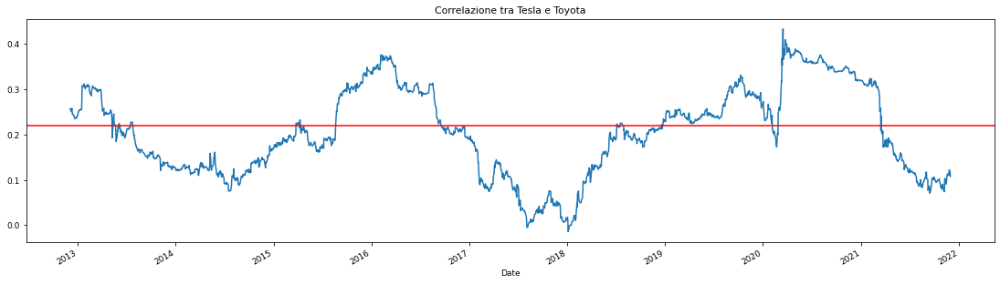

In [29]:
# evoluzione nel tempo della correlazione fra Tesla e Toyota
ax = DF_dailyRSlog["TSLA"].rolling(window=252).corr(DF_dailyRSlog["TM"]).plot(figsize=(19,5), title = "Correlazione tra Tesla e Toyota")
ax.axhline(DF_dailyRSlog.corr().iloc[0,1], c='r');

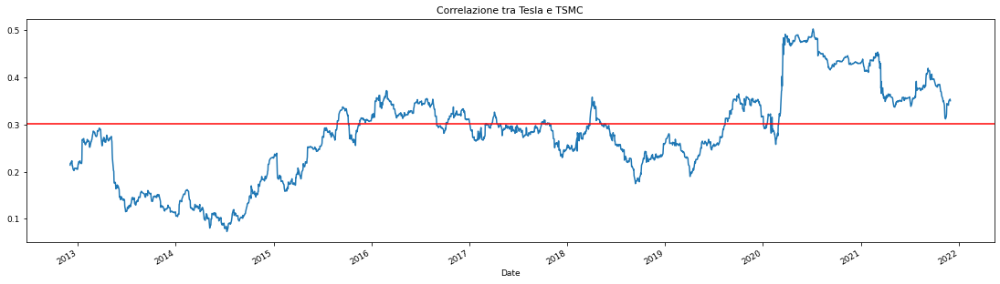

In [30]:
# evoluzione nel tempo della correlazione fra Tesla e TSMC
ax = DF_dailyRSlog["TSLA"].rolling(window=252).corr(DF_dailyRSlog["TSM"]).plot(figsize=(19,5), title = "Correlazione tra Tesla e TSMC")
ax.axhline(DF_dailyRSlog.corr().iloc[0,2], c='r');

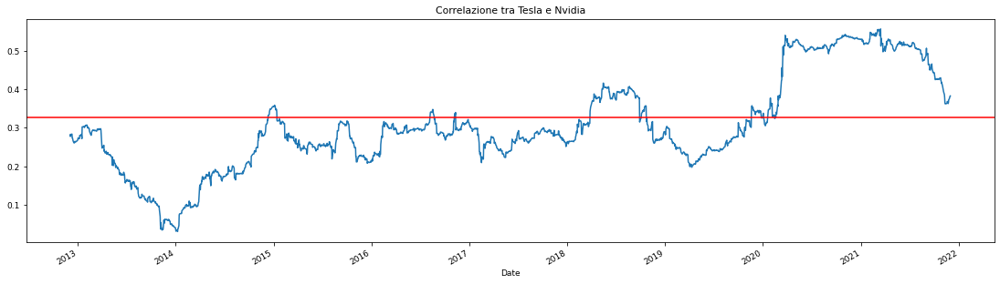

In [31]:
# evoluzione nel tempo della correlazione fra Tesla e Nvidia
ax = DF_dailyRSlog["TSLA"].rolling(window=252).corr(DF_dailyRSlog["NVDA"]).plot(figsize=(19,5), title = "Correlazione tra Tesla e Nvidia")
ax.axhline(DF_dailyRSlog.corr().iloc[0,3], c='r');

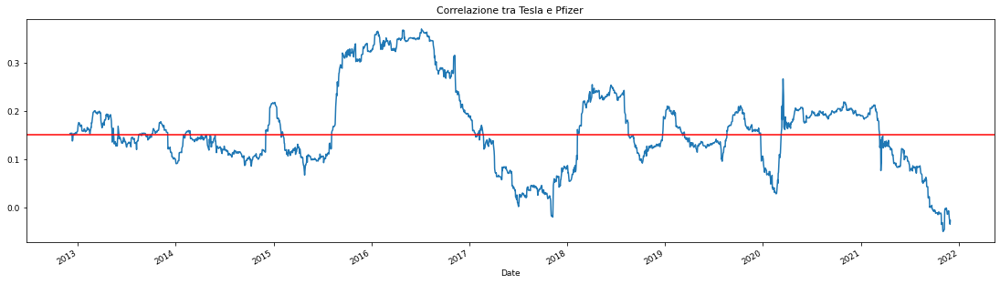

In [32]:
# evoluzione nel tempo della correlazione fra Tesla e Pfizer
ax = DF_dailyRSlog["TSLA"].rolling(window=252).corr(DF_dailyRSlog["PFE"]).plot(figsize=(19,5), title = "Correlazione tra Tesla e Pfizer")
ax.axhline(DF_dailyRSlog.corr().iloc[0,4], c='r');

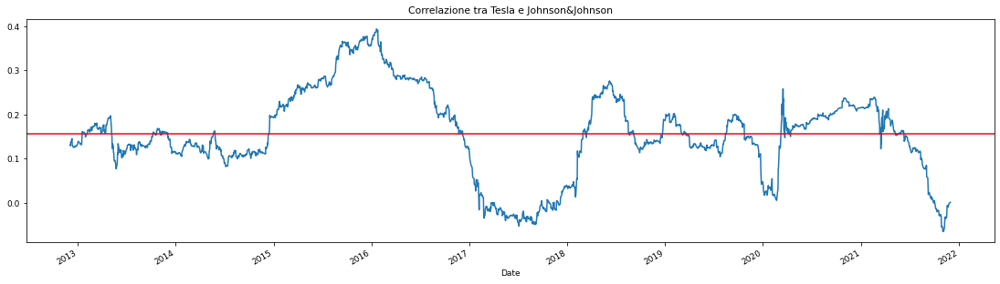

In [33]:
# evoluzione nel tempo della correlazione fra Tesla e Johnson&Johnson
ax = DF_dailyRSlog["TSLA"].rolling(window=252).corr(DF_dailyRSlog["JNJ"]).plot(figsize=(19,5), title = "Correlazione tra Tesla e Johnson&Johnson")
ax.axhline(DF_dailyRSlog.corr().iloc[0,5], c='r');

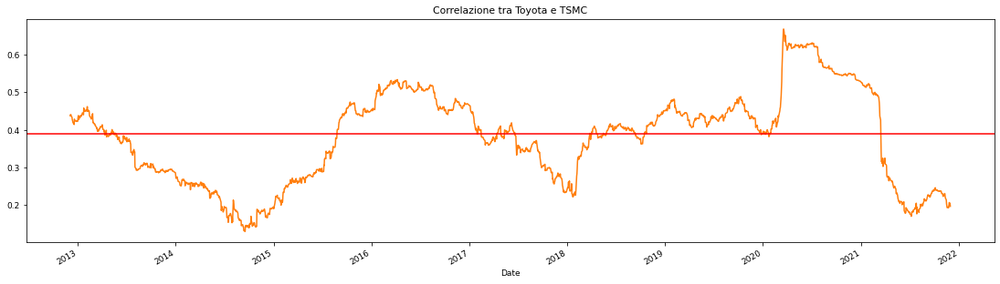

In [34]:
# evoluzione nel tempo della correlazione fra Toyota e TSMC
ax = DF_dailyRSlog["TM"].rolling(window=252).corr(DF_dailyRSlog["TSM"]).plot(figsize=(19,5), title = "Correlazione tra Toyota e TSMC", color = "#ff7f0e")
ax.axhline(DF_dailyRSlog.corr().iloc[1,2], c='r');

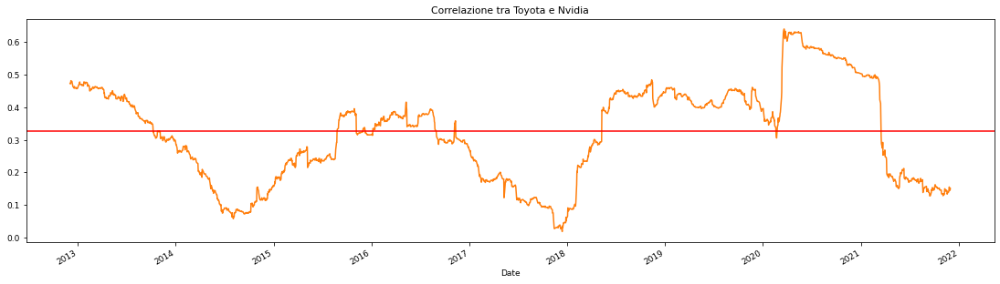

In [35]:
# evoluzione nel tempo della correlazione fra Toyota e Nvidia
ax = DF_dailyRSlog["TM"].rolling(window=252).corr(DF_dailyRSlog["NVDA"]).plot(figsize=(19,5), title = "Correlazione tra Toyota e Nvidia", color = "#ff7f0e")
ax.axhline(DF_dailyRSlog.corr().iloc[1,3], c='r');

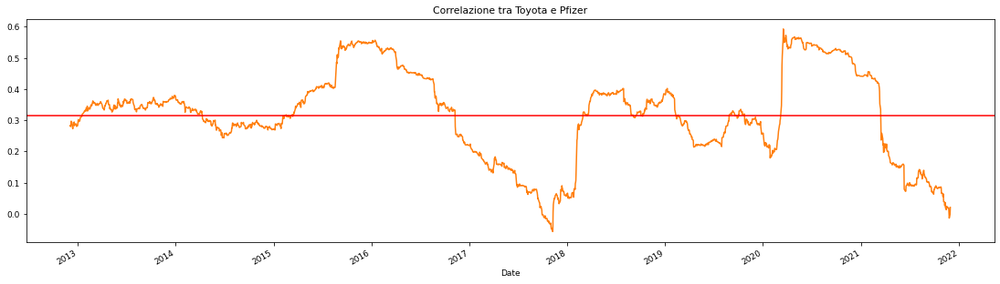

In [36]:
# evoluzione nel tempo della correlazione fra Toyota e Pfizer
ax = DF_dailyRSlog["TM"].rolling(window=252).corr(DF_dailyRSlog["PFE"]).plot(figsize=(19,5), title = "Correlazione tra Toyota e Pfizer", color = "#ff7f0e")
ax.axhline(DF_dailyRSlog.corr().iloc[1,4], c='r');

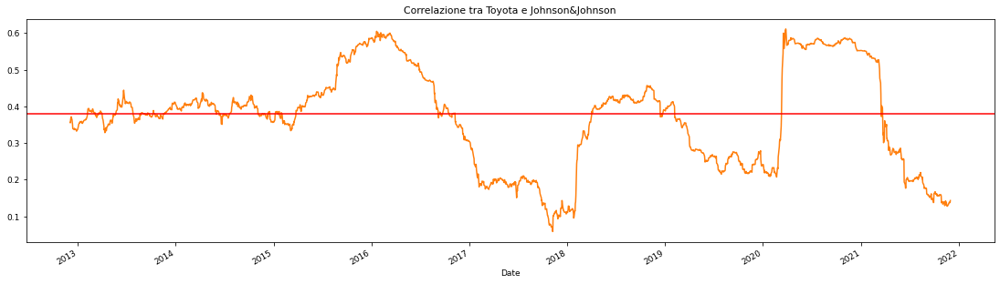

In [37]:
# evoluzione nel tempo della correlazione fra Toyota e Johnson&Johnson
ax = DF_dailyRSlog["TM"].rolling(window=252).corr(DF_dailyRSlog["JNJ"]).plot(figsize=(19,5), title = "Correlazione tra Toyota e Johnson&Johnson", color = "#ff7f0e")
ax.axhline(DF_dailyRSlog.corr().iloc[1,5], c='r');

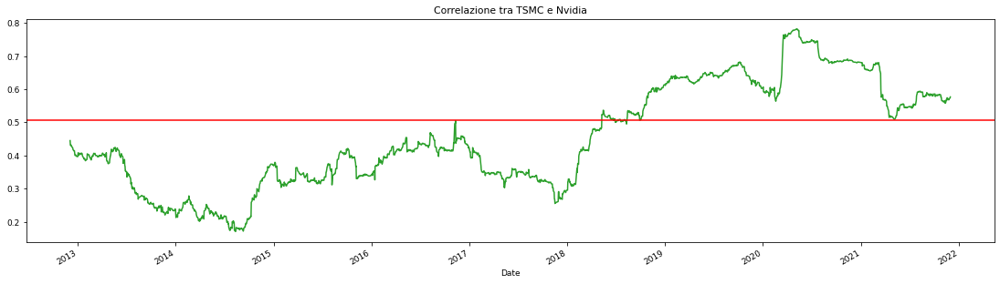

In [38]:
# evoluzione nel tempo della correlazione fra TSMC e Nvidia
ax = DF_dailyRSlog["TSM"].rolling(window=252).corr(DF_dailyRSlog["NVDA"]).plot(figsize=(19,5), title = "Correlazione tra TSMC e Nvidia", color = "#2ca02c")
ax.axhline(DF_dailyRSlog.corr().iloc[2,3], c='r');

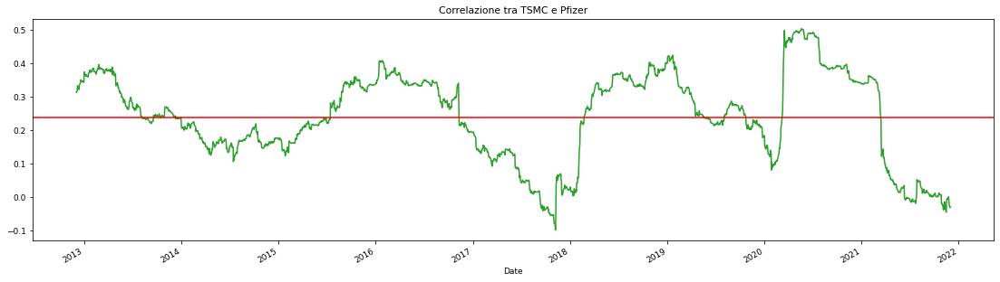

In [39]:
# evoluzione nel tempo della correlazione fra TSMC e Pfizer
ax = DF_dailyRSlog["TSM"].rolling(window=252).corr(DF_dailyRSlog["PFE"]).plot(figsize=(19,5), title = "Correlazione tra TSMC e Pfizer", color = "#2ca02c")
ax.axhline(DF_dailyRSlog.corr().iloc[2,4], c='r');

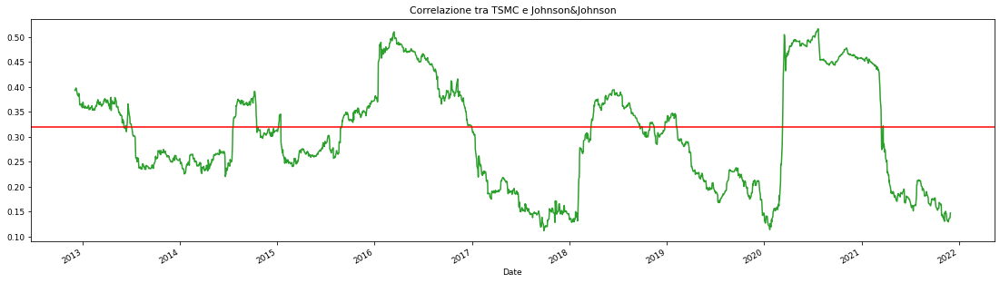

In [40]:
# evoluzione nel tempo della correlazione fra TSMC e Johnson&Johnson
ax = DF_dailyRSlog["TSM"].rolling(window=252).corr(DF_dailyRSlog["JNJ"]).plot(figsize=(19,5), title = "Correlazione tra TSMC e Johnson&Johnson", color = "#2ca02c")
ax.axhline(DF_dailyRSlog.corr().iloc[2,5], c='r');

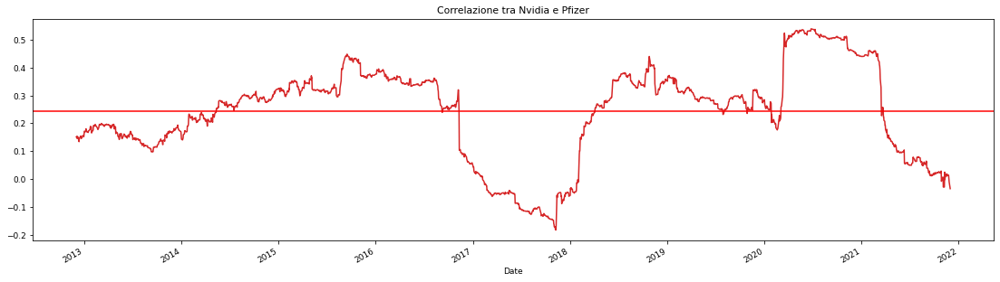

In [41]:
# evoluzione nel tempo della correlazione fra Nvidia e Pfizer
ax = DF_dailyRSlog["NVDA"].rolling(window=252).corr(DF_dailyRSlog["PFE"]).plot(figsize=(19,5), title = "Correlazione tra Nvidia e Pfizer", color = "#d62728")
ax.axhline(DF_dailyRSlog.corr().iloc[3,4], c='r');

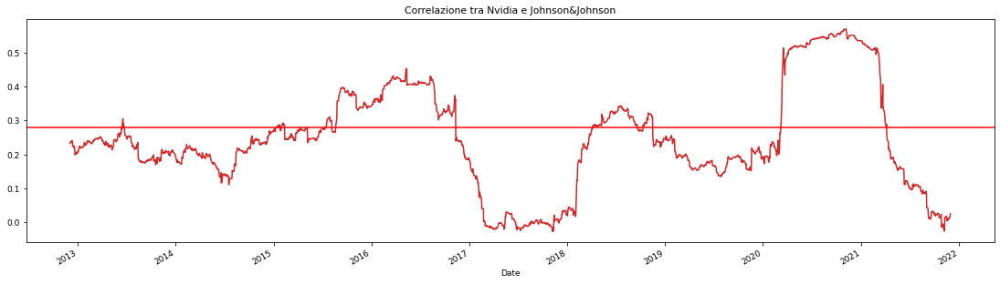

In [42]:
# evoluzione nel tempo della correlazione fra Nvidia e Johnson&Johnson
ax = DF_dailyRSlog["NVDA"].rolling(window=252).corr(DF_dailyRSlog["JNJ"]).plot(figsize=(19,5), title = "Correlazione tra Nvidia e Johnson&Johnson", color = "#d62728")
ax.axhline(DF_dailyRSlog.corr().iloc[3,5], c='r');

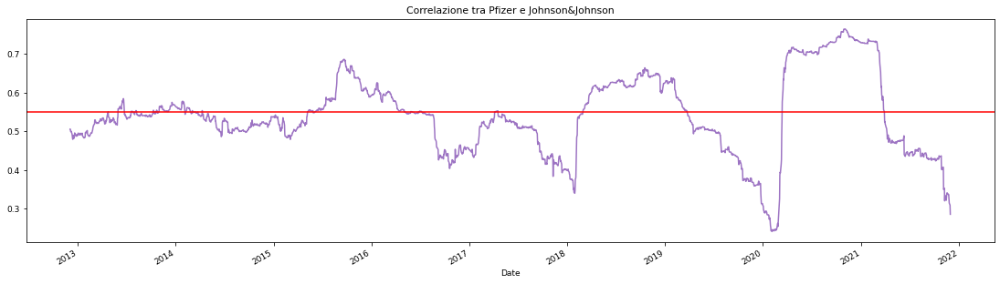

In [43]:
# evoluzione nel tempo della correlazione fra Pfizer e Johnson&Johnson
ax = DF_dailyRSlog["PFE"].rolling(window=252).corr(DF_dailyRSlog["JNJ"]).plot(figsize=(19,5), title = "Correlazione tra Pfizer e Johnson&Johnson", color = "#9d74c3")
ax.axhline(DF_dailyRSlog.corr().iloc[4,5], c='r');

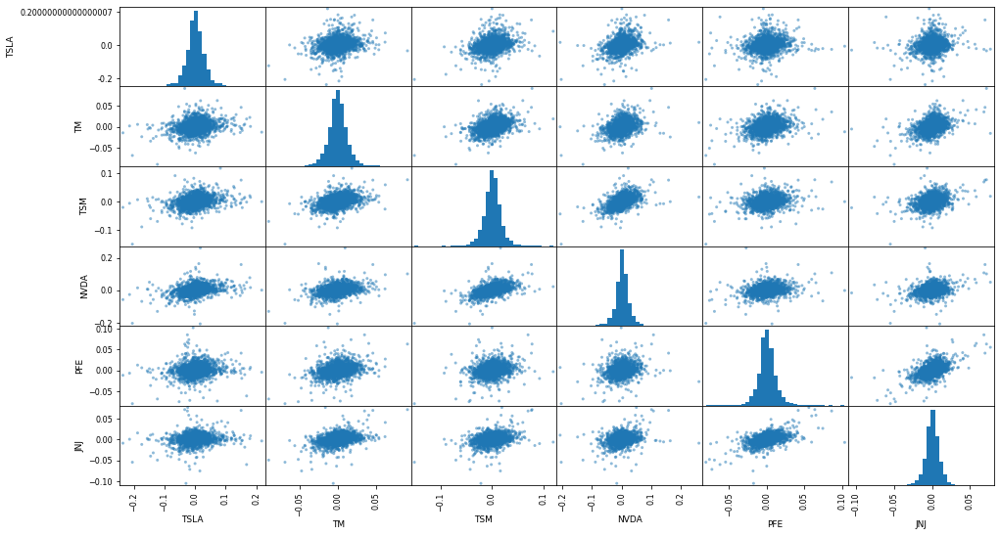

In [44]:
# scatter plots correlazioni medie
pd.plotting.scatter_matrix(DF_dailyRSlog, alpha=0.5,
           diagonal = 'hist',
                  hist_kwds={'bins': 35},
                  figsize = (16,9), grid = True);

## Analisi di previsione dei prezzi tramite ARIMA

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pandas_datareader as web
import itertools
import warnings
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
warnings.filterwarnings("ignore")

def arima_grid_search(dataframe, s):
    p = d = q = range(2)
    param_combinations = list(itertools.product(p, d, q))
    lowest_aic, pdq, pdqs = None, None, None
    total_iterations = 0
    for order in param_combinations:
        for (p, q, d) in param_combinations:
            seasonal_order = (p, q, d, s)
            total_iterations += 1
            try:
                model = SARIMAX(dataframe, order = order,
                               seasonal_order= seasonal_order,
                               enforce_stationarity=False,
                               enforce_invertibility=False,
                               disp = False
                               )
                model_result = model.fit(maxiter=200, disp=False)
                
                if not lowest_aic or model_result.aic < lowest_aic:
                    lowest_aic = model_result.aic
                    pdq, pdqs = order, seasonal_order
            
            except Exception as ex:
                continue
                
    return lowest_aic, pdq, pdqs

def print_adf(result):
    print('ADF statistic: ', result[0])
    print('p-value: ', result[1])

    critical_values = result[4]

    for key, value in critical_values.items():
        print('Critical value (%s): %.3f' % (key, value))

Controllo della stazionarietà della serie

In [46]:
assets = ['TSLA', 'TM', 'TSM', 'NVDA', 'PFE', 'JNJ']
for asset in assets:
    print(asset)
    print("")
    df = web.get_data_yahoo(asset, '30-11-2011', '30-11-2021')
    df = df['Adj Close'].resample('M').last()
    # controllo della stazionarietà della serie
    result = adfuller(df)
    print_adf(result)
    print("")

TSLA

ADF statistic:  4.787012907728425
p-value:  1.0
Critical value (1%): -3.490
Critical value (5%): -2.888
Critical value (10%): -2.581

TM

ADF statistic:  -1.22717642707362
p-value:  0.6617972274469799
Critical value (1%): -3.486
Critical value (5%): -2.886
Critical value (10%): -2.580

TSM

ADF statistic:  1.416589270302842
p-value:  0.9971882165077288
Critical value (1%): -3.490
Critical value (5%): -2.888
Critical value (10%): -2.581

NVDA

ADF statistic:  6.365898003167507
p-value:  1.0
Critical value (1%): -3.486
Critical value (5%): -2.886
Critical value (10%): -2.580

PFE

ADF statistic:  0.6856824297936568
p-value:  0.9895477638603196
Critical value (1%): -3.488
Critical value (5%): -2.887
Critical value (10%): -2.580

JNJ

ADF statistic:  -0.23030450722560702
p-value:  0.9348116750733503
Critical value (1%): -3.492
Critical value (5%): -2.889
Critical value (10%): -2.581



I calcoli mostrano che le serie non sono stazionarie, effettuiamo il detrending

In [47]:
for asset in assets:
    print(asset)
    print("")
    df = web.get_data_yahoo(asset, '30-11-2011', '30-11-2021')
    df = df['Adj Close'].resample('M').last()
    df_log = np.log(df)
    df_log_ma = df_log.rolling(2).mean()
    df_detrend = df_log - df_log_ma
    df_detrend.dropna(inplace= True)

    result = adfuller(df_detrend)
    print_adf(result)
    print("")

TSLA

ADF statistic:  -3.8861274418401814
p-value:  0.0021393470244878768
Critical value (1%): -3.488
Critical value (5%): -2.887
Critical value (10%): -2.580

TM

ADF statistic:  -10.831868144597308
p-value:  1.7000520212442477e-19
Critical value (1%): -3.487
Critical value (5%): -2.886
Critical value (10%): -2.580

TSM

ADF statistic:  -10.765919183959188
p-value:  2.452906235840339e-19
Critical value (1%): -3.487
Critical value (5%): -2.886
Critical value (10%): -2.580

NVDA

ADF statistic:  -10.11293556593676
p-value:  9.893577505761819e-18
Critical value (1%): -3.487
Critical value (5%): -2.886
Critical value (10%): -2.580

PFE

ADF statistic:  -10.31415147713727
p-value:  3.1289968501735006e-18
Critical value (1%): -3.487
Critical value (5%): -2.886
Critical value (10%): -2.580

JNJ

ADF statistic:  -10.153198112538721
p-value:  7.852170280061813e-18
Critical value (1%): -3.487
Critical value (5%): -2.886
Critical value (10%): -2.580



Ora possiamo preparare il modello ARIMA

TSLA



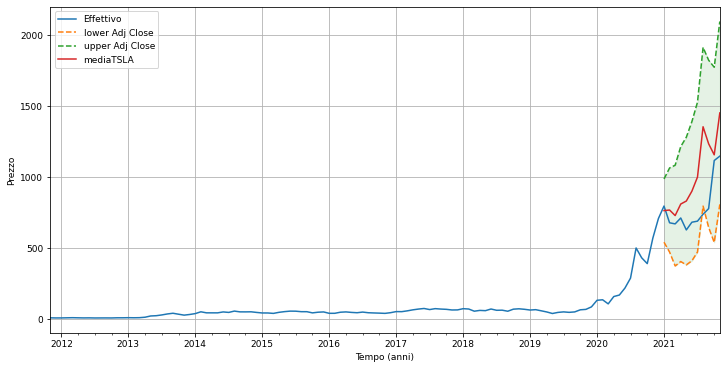

TM



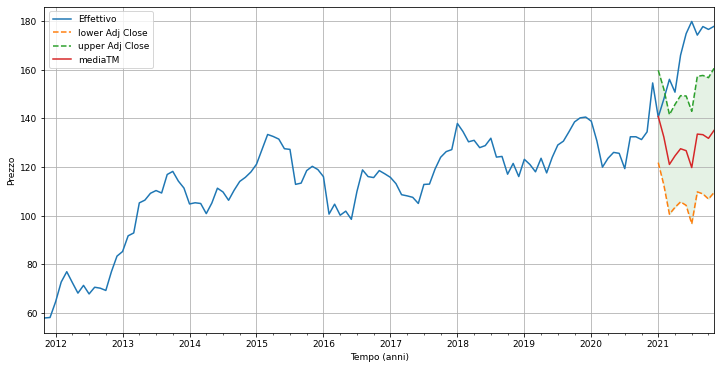

TSM



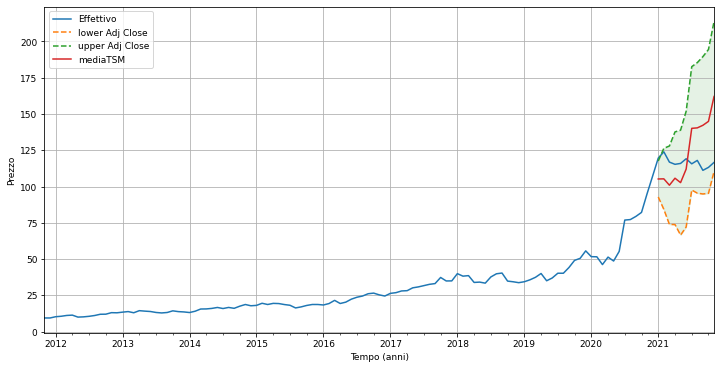

NVDA



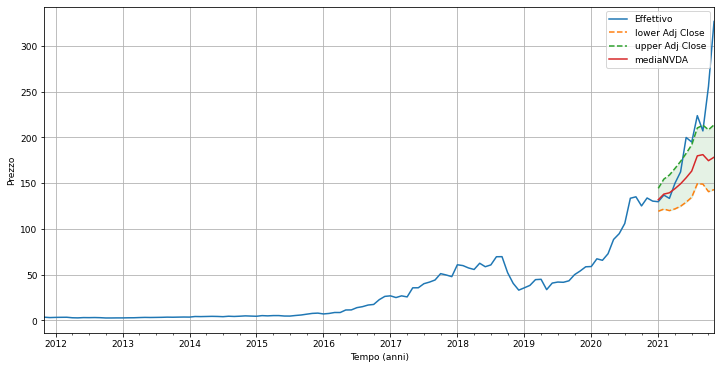

PFE



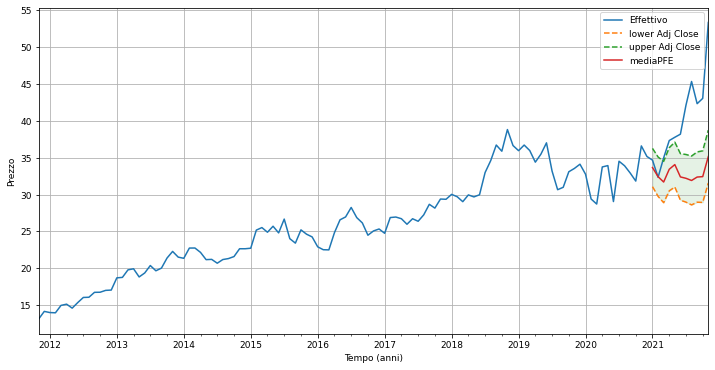

JNJ



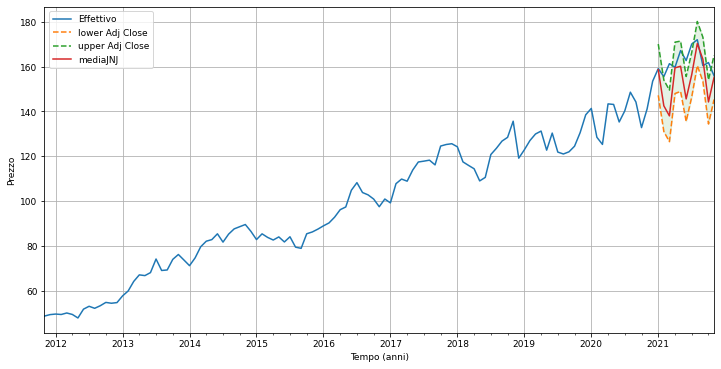

In [48]:
df_pred = pd.DataFrame()
for asset in assets:
    print(asset)
    print("")
    df = web.get_data_yahoo(asset, '30-11-2011', '30-11-2021')
    df = df['Adj Close'].resample('M').last()
    train = df[:'30-08-2018'] # 80 mesi
    test = df['30-06-2018':'30-01-2021'] # 30 mesi
    valid = df['30-01-2021':'30-11-2021'] # 10 mesi
    lowest_aic, order, seasonal_order = arima_grid_search(train, 12)
    model = SARIMAX(test, order = order,
                          seasonal_order= seasonal_order,
                          enforce_stationarity=False,
                          enforce_invertibility=False,
                          disp = False)
    model_results = model.fit(maxiter=200, disp=False)
    prediction = model_results.get_prediction(start='30-01-2021', end = '30-11-2021')
    prediction_ci = prediction.conf_int()
    prediction_ci['media'+asset] = prediction_ci.mean(axis=1)
    df_pred1 = pd.DataFrame(prediction_ci['media'+asset])
    df_pred = pd.concat([df_pred, df_pred1], axis=1)
    plt.figure(figsize=(12,6))
    ax = df['2011':].plot(label = 'Effettivo')
    prediction_ci.plot(ax=ax, style = ['--', '--'], label = 'predicted/forecasted')
    ci_index = prediction_ci.index
    lower_ci = prediction_ci.iloc[:,0]
    upper_ci = prediction_ci.iloc[:,1]
    ax.fill_between(ci_index, lower_ci, upper_ci, color = 'g', alpha = 0.1)
    ax.set_xlabel('Tempo (anni)')
    ax.set_ylabel('Prezzo')
    plt.grid()
    plt.legend()
    plt.show()

## Backtesting di una strategia di trading basata su un algoritmo a scelta

La strategia di cui faremo il backtesting si basa sul concetto di media mobile e prevedere di generare segnali all'incrocio tra due medie mobili.

Quando la media mobile a breve termine (media mobile a 50 giorni) supera la media mobile a lungo termine (200 giorni), acquistiamo il titolo.

Quando la media mobile a lungo termine supera la media a breve termine, vendiamo.

In [49]:
import pandas_datareader.data as web
import datetime as dt
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import style
import numpy as np

style.use('ggplot')

data = web.DataReader('TM', 'yahoo', start_date, end_date)

In [50]:
data.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,66.379997,65.470001,65.610001,65.910004,830900.0,57.942173
2011-12-01,66.199997,65.500000,65.570000,65.720001,449900.0,57.775139
2011-12-02,66.860001,66.110001,66.680000,66.220001,461200.0,58.214706
2011-12-05,68.180000,67.580002,68.029999,68.050003,905700.0,59.823467
2011-12-06,67.550003,66.830002,67.260002,67.110001,593900.0,58.997101


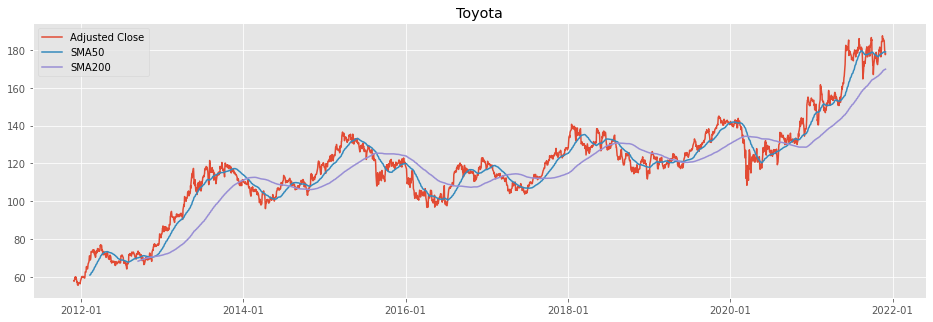

In [51]:
# Creiamo le due serie di medie mobili, una a 50 giorni e una a 200 giorni
data['SMA50'] = data['Adj Close'].rolling(50).mean()
data['SMA200'] = data['Adj Close'].rolling(200).mean()

plt.figure(figsize=(16,9))
ax1 = plt.subplot2grid((7,1), (0,0), rowspan = 4, colspan = 1, title = "Toyota")
ax1.plot(data['Adj Close'], label = 'Adjusted Close')
ax1.plot(data['SMA50'], label = 'SMA50')
ax1.plot(data['SMA200'], label = 'SMA200')

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax1.legend();

Creiamo la strategia

In [52]:
data['Price_yesterday'] = data['Adj Close'].shift(1)
# rendimento semplice
data['Change'] = data['Adj Close'] / data['Price_yesterday']
data['Invested_SMA'] = [1 if data.loc[i, 'SMA50'] > data.loc[i, 'SMA200'] 
                        else 0 for i in data.index]

Rendimento della strategia

In [53]:
sma = data[data['Invested_SMA'] == 1]

In [54]:
# rendimento composto
sma['Return'] = np.cumprod(sma['Change'])

Rendimento del buy and hold

In [55]:
data['Buy_and_hold'] = np.cumprod(data['Change'])

Confronto tra le strategie

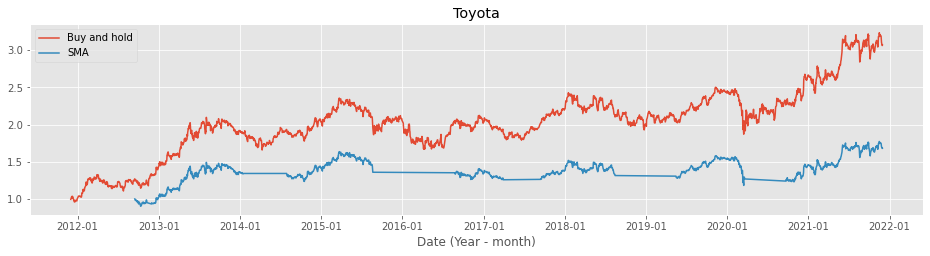

In [56]:
plt.figure(figsize=(16,9))
ax1 = plt.subplot2grid((10,1), (0,0), rowspan = 4, colspan = 1, title = 'Toyota')

ax1.plot(data['Buy_and_hold'], label = 'Buy and hold')
ax1.plot(sma['Return'], label = 'SMA')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax1.set_xlabel('Date (Year - month)')
ax1.legend()
plt.show()

In conclusione, notiamo che la strategia creata non batte la Buy and Hold.

## CAPM

Calcolare il beta di ciascun titolo rispetto al mercato

In [57]:
beta = [0, 0, 0, 0, 0, 0]
market_benchmark = ['^GSPC', '^NYA', '^NYA', '^GSPC', '^GSPC', '^GSPC']
i = 0
while i < len(assets):
    df_CAPM = web.get_data_yahoo([assets[i], market_benchmark[i]], start_date, end_date)
    X = df_CAPM['Adj Close'].rename(columns={assets[i]:'asset', market_benchmark[i]:'market'})\
                            .resample('M').last().pct_change().dropna()
    covariance = X.cov().iloc[0,1]
    benchmark_variance = X.market.var()
    beta[i] = covariance / benchmark_variance
    print("Beta di", assets[i], ": ", round(beta[i], 4))
    i += 1

Beta di TSLA :  1.814
Beta di TM :  0.6181
Beta di TSM :  0.8848
Beta di NVDA :  1.3454
Beta di PFE :  0.756
Beta di JNJ :  0.72


Calcolare l’esposizione di ciascun titolo ai fattori di rischio Fama-French

In [58]:
import statsmodels.formula.api as smf
# cinque fattori con fattori Robust Minus Weak (RMW) e Conservative Minus Aggressive (CMA)
df_five_factor = web.DataReader('F-F_Research_Data_5_Factors_2x3', 'famafrench', start_date)[0]
df_five_factor.index = df_five_factor.index.format()
#df_five_factor.head()
i = 0
while i < len(assets):
    print("")
    print("Esposizione di", assets[i], "ai fattori di rischio Fama-French")
    df_FF = web.get_data_yahoo(assets[i], start_date, end_date)
    y = df_FF['Adj Close'].resample('M').last().pct_change().dropna()
    y.index = y.index.strftime('%Y-%m')
    y.name = 'return'
    five_factor_data = df_five_factor.join(y)
    five_factor_data.columns = ['mkt', 'smb', 'hml', 'rmw', 'cma', 'rf', 'rtn']
    five_factor_data.loc[:, five_factor_data.columns != 'rtn'] /= 100
    five_factor_data.dropna(inplace = True)
    #five_factor_data = five_factor_data.loc[start_date:end_date]
    five_factor_data['excess_rtn'] = five_factor_data['rtn'] - five_factor_data['rf']
    five_factor_model = smf.ols(formula ='excess_rtn ~ mkt + smb + hml + rmw + cma', data = five_factor_data).fit()
    print(five_factor_model.summary())
    i += 1


Esposizione di TSLA ai fattori di rischio Fama-French
                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.185
Model:                            OLS   Adj. R-squared:                  0.150
Method:                 Least Squares   F-statistic:                     5.192
Date:                Mon, 31 Jan 2022   Prob (F-statistic):           0.000249
Time:                        15:55:06   Log-Likelihood:                 46.757
No. Observations:                 120   AIC:                            -81.51
Df Residuals:                     114   BIC:                            -64.79
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.342
Model:                            OLS   Adj. R-squared:                  0.313
Method:                 Least Squares   F-statistic:                     11.82
Date:                Mon, 31 Jan 2022   Prob (F-statistic):           3.18e-09
Time:                        15:55:09   Log-Likelihood:                 197.31
No. Observations:                 120   AIC:                            -382.6
Df Residuals:                     114   BIC:                            -365.9
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0006      0.005      0.118      0.9

Utilizzare il beta per calcolare il rendimento atteso

Symbols           asset       market  risk_free    rtn_rf  rtn_market  \
Date                                                                    
2012-01-31     5.814000  1312.410034      0.055  0.004472    0.039111   
2012-02-29     6.682000  1365.680054      0.075  0.006045    0.034545   
2012-03-31     7.448000  1408.469971      0.065  0.005262    0.026071   
2012-04-30     6.626000  1397.910034      0.090  0.007207   -0.014705   
2012-05-31     5.900000  1310.329956      0.060  0.004868   -0.067518   
...                 ...          ...        ...       ...         ...   
2021-07-31   687.200012  4395.259766      0.040  0.003274    0.019474   
2021-08-31   735.719971  4522.680176      0.040  0.003274    0.025717   
2021-09-30   775.479980  4307.540039      0.028  0.002304   -0.049873   
2021-10-31  1114.000000  4605.379883      0.048  0.003915    0.065229   
2021-11-30  1144.760010  4567.000000      0.048  0.003915   -0.012248   

Symbols     asset_rtn_exp  asset_rtn  
Date       

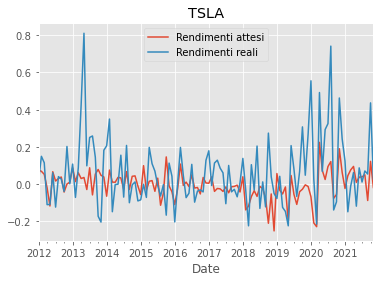

Symbols          asset        market  risk_free    rtn_rf  rtn_market  \
Date                                                                    
2012-01-31   64.597031   7838.479980      0.055  0.004472    0.043870   
2012-02-29   72.711227   8113.240234      0.075  0.006045    0.029008   
2012-03-31   76.963066   8206.929688      0.065  0.005262    0.006286   
2012-04-30   72.495270   8119.060059      0.090  0.007207   -0.017914   
2012-05-31   68.160454   7463.959961      0.060  0.004868   -0.085554   
...                ...           ...        ...       ...         ...   
2021-07-31  179.839996  16602.289062      0.040  0.003274   -0.000438   
2021-08-31  174.229996  16806.439453      0.040  0.003274    0.009023   
2021-09-30  177.750000  16144.919922      0.028  0.002304   -0.041665   
2021-10-31  176.570007  17016.410156      0.048  0.003915    0.050065   
2021-11-30  177.850006  16318.969727      0.048  0.003915   -0.044901   

Symbols     asset_rtn_exp  asset_rtn  
Date       

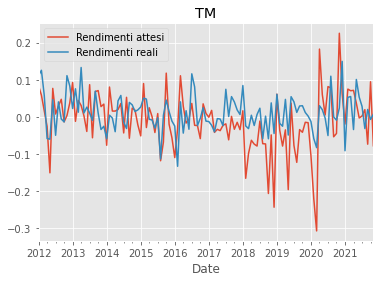

Symbols          asset        market  risk_free    rtn_rf  rtn_market  \
Date                                                                    
2012-01-31   10.332395   7838.479980      0.055  0.004472    0.043870   
2012-02-29   10.655279   8113.240234      0.075  0.006045    0.029008   
2012-03-31   11.212996   8206.929688      0.065  0.005262    0.006286   
2012-04-30   11.433146   8119.060059      0.090  0.007207   -0.017914   
2012-05-31   10.075551   7463.959961      0.060  0.004868   -0.085554   
...                ...           ...        ...       ...         ...   
2021-07-31  115.684334  16602.289062      0.040  0.003274   -0.000438   
2021-08-31  118.034920  16806.439453      0.040  0.003274    0.009023   
2021-09-30  111.190048  16144.919922      0.028  0.002304   -0.041665   
2021-10-31  113.231598  17016.410156      0.048  0.003915    0.050065   
2021-11-30  116.667397  16318.969727      0.048  0.003915   -0.044901   

Symbols     asset_rtn_exp  asset_rtn  
Date       

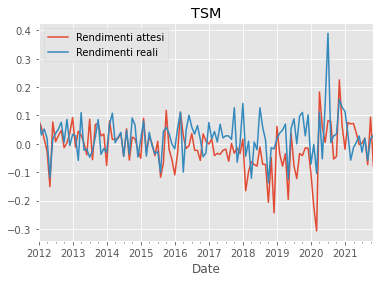

Symbols          asset       market  risk_free    rtn_rf  rtn_market  \
Date                                                                   
2012-01-31    3.391969  1312.410034      0.055  0.004472    0.039111   
2012-02-29    3.479237  1365.680054      0.075  0.006045    0.034545   
2012-03-31    3.536651  1408.469971      0.065  0.005262    0.026071   
2012-04-30    2.985484  1397.910034      0.090  0.007207   -0.014705   
2012-05-31    2.854581  1310.329956      0.060  0.004868   -0.067518   
...                ...          ...        ...       ...         ...   
2021-07-31  194.931763  4395.259766      0.040  0.003274    0.019474   
2021-08-31  223.822601  4522.680176      0.040  0.003274    0.025717   
2021-09-30  207.134644  4307.540039      0.028  0.002304   -0.049873   
2021-10-31  255.638702  4605.379883      0.048  0.003915    0.065229   
2021-11-30  326.720001  4567.000000      0.048  0.003915   -0.012248   

Symbols     asset_rtn_exp  asset_rtn  
Date                    

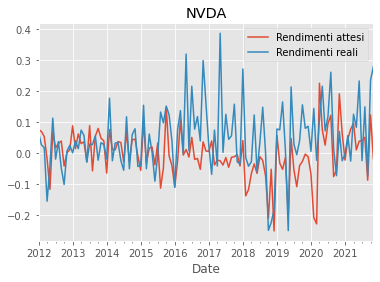

Symbols         asset       market  risk_free    rtn_rf  rtn_market  \
Date                                                                  
2012-01-31  13.998348  1312.410034      0.055  0.004472    0.039111   
2012-02-29  13.965302  1365.680054      0.075  0.006045    0.034545   
2012-03-31  14.969908  1408.469971      0.065  0.005262    0.026071   
2012-04-30  15.135139  1397.910034      0.090  0.007207   -0.014705   
2012-05-31  14.597633  1310.329956      0.060  0.004868   -0.067518   
...               ...          ...        ...       ...         ...   
2021-07-31  42.117268  4395.259766      0.040  0.003274    0.019474   
2021-08-31  45.324516  4522.680176      0.040  0.003274    0.025717   
2021-09-30  42.314030  4307.540039      0.028  0.002304   -0.049873   
2021-10-31  43.032223  4605.379883      0.048  0.003915    0.065229   
2021-11-30  53.324566  4567.000000      0.048  0.003915   -0.012248   

Symbols     asset_rtn_exp  asset_rtn  
Date                                 

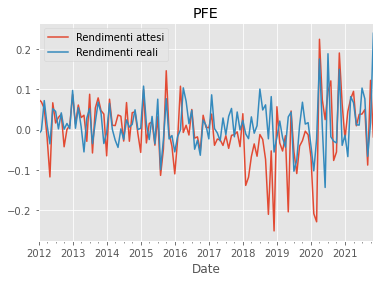

Symbols          asset       market  risk_free    rtn_rf  rtn_market  \
Date                                                                   
2012-01-31   49.684265  1312.410034      0.055  0.004472    0.039111   
2012-02-29   49.491936  1365.680054      0.075  0.006045    0.034545   
2012-03-31   50.161163  1408.469971      0.065  0.005262    0.026071   
2012-04-30   49.507149  1397.910034      0.090  0.007207   -0.014705   
2012-05-31   47.938873  1310.329956      0.060  0.004868   -0.067518   
...                ...          ...        ...       ...         ...   
2021-07-31  170.068802  4395.259766      0.040  0.003274    0.019474   
2021-08-31  172.003372  4522.680176      0.040  0.003274    0.025717   
2021-09-30  160.449051  4307.540039      0.028  0.002304   -0.049873   
2021-10-31  161.820068  4605.379883      0.048  0.003915    0.065229   
2021-11-30  155.929993  4567.000000      0.048  0.003915   -0.012248   

Symbols     asset_rtn_exp  asset_rtn  
Date                    

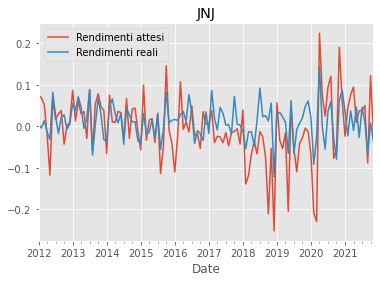

In [59]:
risk_free = '^IRX'
i = 0
while i < len(assets):
    df = web.get_data_yahoo([assets[i], market_benchmark[i], risk_free], start_date, end_date)
    X1 = df['Adj Close'].rename(columns={assets[i]:'asset', market_benchmark[i]:'market', risk_free: 'risk_free'})
    X1 = X1.resample('M').last()
    X1['rtn_rf'] = (1 + X1['risk_free'])**(30/360) - 1
    X1['rtn_market'] = X1['market'].pct_change() - X1['rtn_rf']
    X1.dropna(inplace = True)
    X1['asset_rtn_exp'] = X1['rtn_rf'] + beta[0] * X1['rtn_market'] 
    X1['asset_rtn'] = X1['asset'].pct_change()
    X1.dropna(inplace = True)
    print(X1)
    X1['asset_rtn_exp'].plot(grid = True, label = "Rendimenti attesi")
    X1['asset_rtn'].plot(grid = True, label = "Rendimenti reali")
    plt.title(assets[i])
    plt.legend()
    plt.show();
    i += 1

## Costruzione di portafoglio

Metodo di simulazione con i rendimenti passati - Monte Carlo

In [60]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import warnings
import seaborn as sns

plt.style.use('seaborn')
sns.set_palette('cubehelix')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

from datetime import date, datetime
import numpy as np
import pandas as pd
import pandas_datareader.data as web

In [61]:
# parametri
n_port = 10 ** 6
n_days = 252
risky_assets = ['TSLA', 'TM', 'TSM', 'NVDA', 'PFE', 'JNJ']
n_assets = len(risky_assets)

In [62]:
# download dei prezzi
df = web.DataReader(risky_assets, 'yahoo', '2011-11-30', '2020-11-30')['Adj Close'] 

In [63]:
# calcolo rendimenti e volatilità
returns_df = df.pct_change()
avg_returns = returns_df.mean() * n_days
cov_mat = returns_df.cov() * n_days

In [64]:
# simuliamo portafogli con pesi casuali
np.random.seed(42)
weights = np.random.random(size=(n_port, n_assets))
weights /=  np.sum(weights, axis=1)[:, np.newaxis]

In [65]:
# calcoliamo i rendimenti di portafoglio
portf_rtns = np.dot(weights, avg_returns)

portf_vol = []
for i in range(0, len(weights)):
    portf_vol.append(np.sqrt(np.dot(weights[i].T, 
                                    np.dot(cov_mat, weights[i]))))
portf_vol = np.array(portf_vol)  
portf_sharpe_ratio = portf_rtns / portf_vol

In [66]:
# creiamo un df con tutti i dati
df = pd.DataFrame({'returns': portf_rtns,
                   'volatility': portf_vol,
                   'sharpe_ratio': portf_sharpe_ratio})

In [67]:
# creazione frontiera efficiente
n_points = 700
portf_vol_ef = []
indices_to_skip = []

portf_rtns_ef = np.linspace(df.returns.min(), 
                            df.returns.max(), 
                           n_points)
portf_rtns_ef = np.round(portf_rtns_ef, 2)    
portf_rtns = np.round(portf_rtns, 2)

for point_index in range(n_points):
    if portf_rtns_ef[point_index] not in portf_rtns:
        indices_to_skip.append(point_index)
        continue
    matched_ind = np.where(portf_rtns == portf_rtns_ef[point_index])
    portf_vol_ef.append(np.min(portf_vol[matched_ind]))
    
portf_rtns_ef = np.delete(portf_rtns_ef, indices_to_skip)

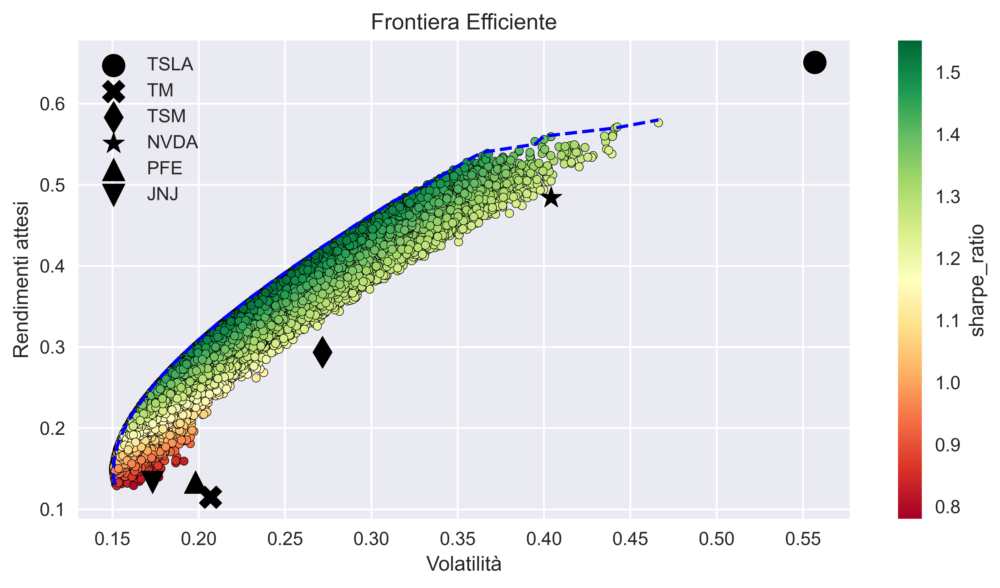

In [68]:
MARKS = ['o', 'X', 'd', '*', '^', 'v']

fig, ax = plt.subplots()
df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.set(xlabel='Volatilità', 
       ylabel='Rendimenti attesi', 
       title='Frontiera Efficiente')
ax.plot(portf_vol_ef, portf_rtns_ef, 'b--')
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(cov_mat.iloc[asset_index, asset_index]), 
                y=avg_returns[asset_index], 
                marker=MARKS[asset_index], 
                s=150, 
                color='black',
                label=risky_assets[asset_index])
ax.legend()

plt.tight_layout()
plt.show()

In [69]:
# ricerca portafoglio con sharpe ratio più alto
max_sharpe_ind = np.argmax(df.sharpe_ratio)
max_sharpe_portf = df.loc[max_sharpe_ind]

# ricerca portafoglio a volatilità minima
min_vol_ind = np.argmin(df.volatility)
min_vol_portf = df.loc[min_vol_ind]

In [70]:
print('Portafoglio Max Sharpe ratio')
print('Performance')
for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
max_sharpe_mc_rp_w = []
for x, y in zip(risky_assets, weights[np.argmax(df.sharpe_ratio)]):
    max_sharpe_mc_rp_w.append(y)
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)
max_sharpe_mc_rp = max_sharpe_portf

Portafoglio Max Sharpe ratio
Performance
returns: 37.54% volatility: 24.20% sharpe_ratio: 155.12% 
Weights
TSLA: 22.56% TM: 0.00% TSM: 23.21% NVDA: 25.11% PFE: 6.83% JNJ: 22.28% 

In [71]:
print('Portafoglio a volatilità minima')
print('Performance')
for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(risky_assets, weights[np.argmin(df.volatility)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Portafoglio a volatilità minima
Performance
returns: 14.79% volatility: 15.05% sharpe_ratio: 98.28% 
Weights
TSLA: 1.04% TM: 27.27% TSM: 7.91% NVDA: 0.41% PFE: 19.17% JNJ: 44.19% 

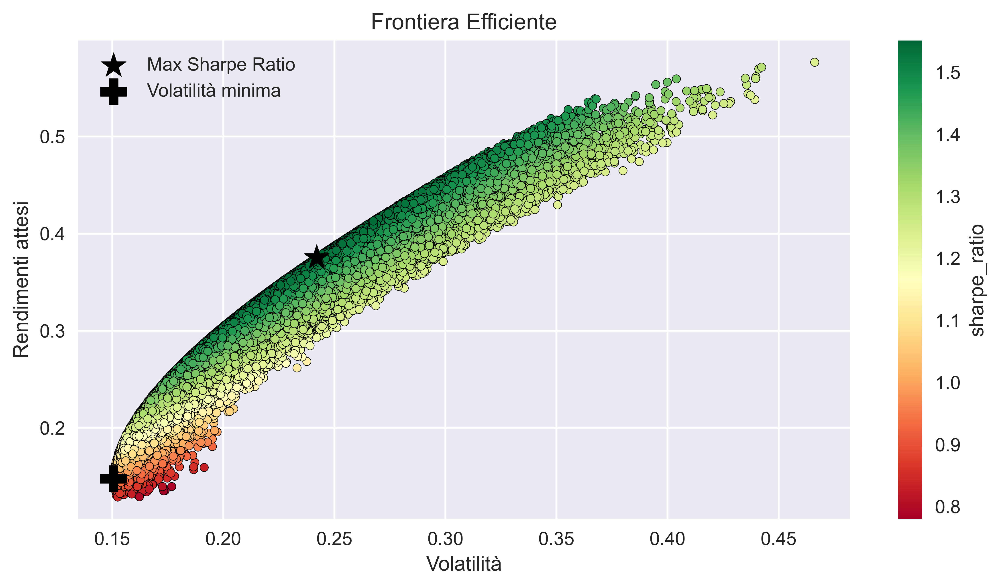

In [72]:
fig, ax = plt.subplots()
df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.scatter(x=max_sharpe_portf.volatility, 
           y=max_sharpe_portf.returns, 
           c='black', marker='*', 
           s=200, label='Max Sharpe Ratio')
ax.scatter(x=min_vol_portf.volatility, 
           y=min_vol_portf.returns, 
           c='black', marker='P', 
           s=200, label='Volatilità minima')
ax.set(xlabel='Volatilità', ylabel='Rendimenti attesi', 
       title='Frontiera Efficiente')
ax.legend()

plt.tight_layout()

plt.show()

Metodo analitico con i rendimenti passati - funzione di ottimizzazione di Scipy

In [73]:
import numpy as np
import scipy.optimize as sco

In [74]:
def get_portf_rtn(w, avg_rtns):
    return np.sum(avg_rtns * w)

def get_portf_vol(w, avg_rtns, cov_mat):
    return np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))

In [75]:
def get_efficient_frontier(avg_rtns, cov_mat, rtns_range):
    
    efficient_portfolios = []
    
    n_assets = len(avg_returns)
    args = (avg_returns, cov_mat)
    bounds = tuple((0,1) for asset in range(n_assets))
    initial_guess = n_assets * [1. / n_assets, ]
    
    for ret in rtns_range:
        constraints = ({'type': 'eq', 
                        'fun': lambda x: get_portf_rtn(x, avg_rtns) - ret},
                       {'type': 'eq', 
                        'fun': lambda x: np.sum(x) - 1})
        efficient_portfolio = sco.minimize(get_portf_vol, initial_guess, 
                                           args=args, method='SLSQP', 
                                           constraints=constraints,
                                           bounds=bounds)
        efficient_portfolios.append(efficient_portfolio)
    
    return efficient_portfolios

In [76]:
rtns_range = np.linspace(-0.22, 0.32, 200)

In [77]:
efficient_portfolios = get_efficient_frontier(avg_returns, 
                                              cov_mat, 
                                              rtns_range)

In [78]:
vols_range = [x['fun'] for x in efficient_portfolios]

In [79]:
# portafoglio con volatilità minima

min_vol_ind = np.argmin(vols_range)
min_vol_portf_rtn = rtns_range[min_vol_ind]
min_vol_portf_vol = efficient_portfolios[min_vol_ind]['fun']

min_vol_portf = {'Return': min_vol_portf_rtn,
                 'Volatility': min_vol_portf_vol,
                 'Sharpe Ratio': (min_vol_portf_rtn / 
                                  min_vol_portf_vol)}

In [80]:
print('Portafoglio a volatilità minima')
print('Performance')

for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)

print('\nWeights')
for x, y in zip(risky_assets, efficient_portfolios[min_vol_ind]['x']):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Portafoglio a volatilità minima
Performance
Return: 14.36% Volatility: 15.03% Sharpe Ratio: 95.58% 
Weights
TSLA: 0.29% TM: 25.75% TSM: 8.39% NVDA: 0.00% PFE: 22.58% JNJ: 42.99% 

In [81]:
# portafoglio con lo sharpe ratio più alto

# funzione obiettivo
def neg_sharpe_ratio(w, avg_rtns, cov_mat, rf_rate):
    portf_returns = np.sum(avg_rtns * w)
    portf_volatility = np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))
    portf_sharpe_ratio = (portf_returns - rf_rate) / portf_volatility
    return -portf_sharpe_ratio

In [82]:
# ricerca del portafoglio ottimale
n_assets = len(avg_returns)
RF_RATE = 0

args = (avg_returns, cov_mat, RF_RATE)
constraints = ({'type': 'eq', 
                'fun': lambda x: np.sum(x) - 1})
bounds = tuple((0,1) for asset in range(n_assets))
initial_guess = n_assets * [1. / n_assets]

max_sharpe_portf = sco.minimize(neg_sharpe_ratio, 
                                x0=initial_guess, 
                                args=args,
                                method='SLSQP', 
                                bounds=bounds, 
                                constraints=constraints)

In [83]:
max_sharpe_portf_w = max_sharpe_portf['x']
max_sharpe_scipy_rp_w = max_sharpe_portf_w
max_sharpe_portf = {'Return': get_portf_rtn(max_sharpe_portf_w, 
                                            avg_returns),
                    'Volatility': get_portf_vol(max_sharpe_portf_w, 
                                                avg_returns, 
                                                cov_mat),
                    'Sharpe Ratio': -max_sharpe_portf['fun']}

In [84]:
print('Portafoglio Max Sharpe ratio')
print('Performance')

for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)

print('\nWeights')
for x, y in zip(risky_assets, max_sharpe_portf_w):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Portafoglio Max Sharpe ratio
Performance
Return: 37.16% Volatility: 23.95% Sharpe Ratio: 155.15% 
Weights
TSLA: 21.85% TM: 0.00% TSM: 24.42% NVDA: 24.51% PFE: 8.40% JNJ: 20.82% 

Metodo di simulazione con i rendimenti attesi - Monte Carlo

In [85]:
# parametri
n_port = 10 ** 5
n_days = 252
risky_assets = ['TSLA', 'TM', 'TSM', 'NVDA', 'PFE', 'JNJ']
n_assets = len(risky_assets)

In [86]:
# calcolo rendimenti e volatilità
returns_df = df_pred.pct_change()
avg_returns = returns_df.mean() * n_days
cov_mat = returns_df.cov() * n_days

In [87]:
# simuliamo portafogli con pesi casuali
np.random.seed(42)
weights = np.random.random(size=(n_port, n_assets))
weights /=  np.sum(weights, axis=1)[:, np.newaxis]

In [88]:
# calcoliamo i rendimenti di portafoglio
portf_rtns = np.dot(weights, avg_returns)

portf_vol = []
for i in range(0, len(weights)):
    portf_vol.append(np.sqrt(np.dot(weights[i].T, 
                                    np.dot(cov_mat, weights[i]))))
portf_vol = np.array(portf_vol)  
portf_sharpe_ratio = portf_rtns / portf_vol

In [89]:
# creiamo un df con tutti i dati
df = pd.DataFrame({'returns': portf_rtns,
                   'volatility': portf_vol,
                   'sharpe_ratio': portf_sharpe_ratio})

In [90]:
# creazione frontiera efficiente
n_points = 100
portf_vol_ef = []
indices_to_skip = []

portf_rtns_ef = np.linspace(df.returns.min(), 
                            df.returns.max(), 
                           n_points)
portf_rtns_ef = np.round(portf_rtns_ef, 2)    
portf_rtns = np.round(portf_rtns, 2)

for point_index in range(n_points):
    if portf_rtns_ef[point_index] not in portf_rtns:
        indices_to_skip.append(point_index)
        continue
    matched_ind = np.where(portf_rtns == portf_rtns_ef[point_index])
    portf_vol_ef.append(np.min(portf_vol[matched_ind]))
    
portf_rtns_ef = np.delete(portf_rtns_ef, indices_to_skip)

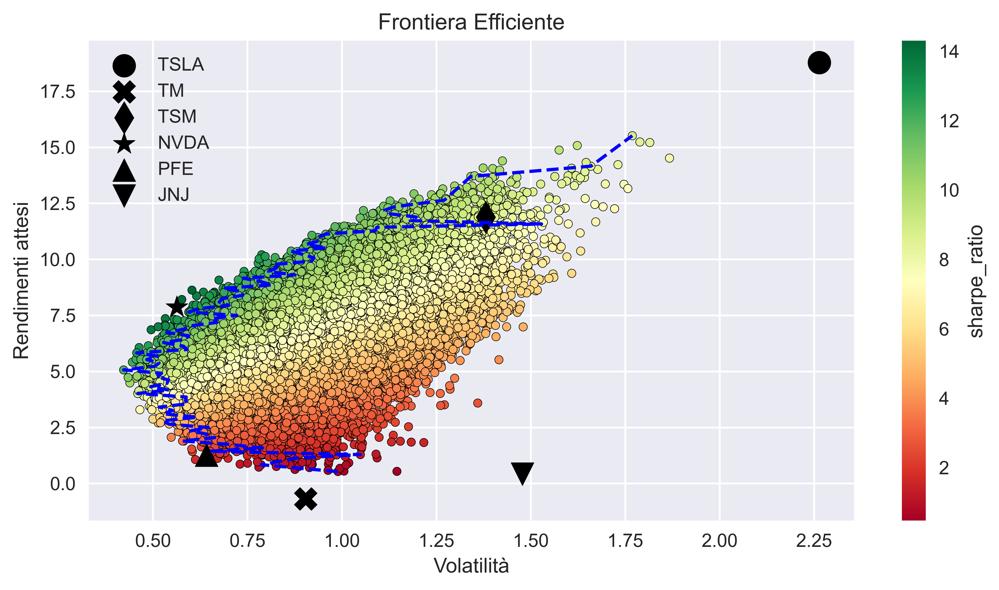

In [91]:
MARKS = ['o', 'X', 'd', '*', '^', 'v']

fig, ax = plt.subplots()
df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.set(xlabel='Volatilità', 
       ylabel='Rendimenti attesi', 
       title='Frontiera Efficiente')
ax.plot(portf_vol_ef, portf_rtns_ef, 'b--')
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(cov_mat.iloc[asset_index, asset_index]), 
                y=avg_returns[asset_index], 
                marker=MARKS[asset_index], 
                s=150, 
                color='black',
                label=risky_assets[asset_index])
ax.legend()

plt.tight_layout()
plt.show()

In [92]:
# ricerca portafoglio con sharpe ratio più alto
max_sharpe_ind = np.argmax(df.sharpe_ratio)
max_sharpe_portf = df.loc[max_sharpe_ind]

# ricerca portafoglio a volatilità minima
min_vol_ind = np.argmin(df.volatility)
min_vol_portf = df.loc[min_vol_ind]

In [93]:
print('Portafoglio Max Sharpe ratio')
print('Performance')
for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
max_sharpe_mc_ra_w = []
for x, y in zip(risky_assets, weights[np.argmax(df.sharpe_ratio)]):
    max_sharpe_mc_ra_w.append(y)
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)
max_sharpe_mc_ra = max_sharpe_portf

Portafoglio Max Sharpe ratio
Performance
returns: 862.92% volatility: 60.31% sharpe_ratio: 1430.79% 
Weights
TSLA: 3.34% TM: 3.79% TSM: 24.39% NVDA: 64.65% PFE: 2.83% JNJ: 0.99% 

In [94]:
print('Portafoglio a volatilità minima')
print('Performance')
for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(risky_assets, weights[np.argmin(df.volatility)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Portafoglio a volatilità minima
Performance
returns: 506.87% volatility: 42.23% sharpe_ratio: 1200.31% 
Weights
TSLA: 0.06% TM: 1.18% TSM: 5.79% NVDA: 48.92% PFE: 40.14% JNJ: 3.91% 

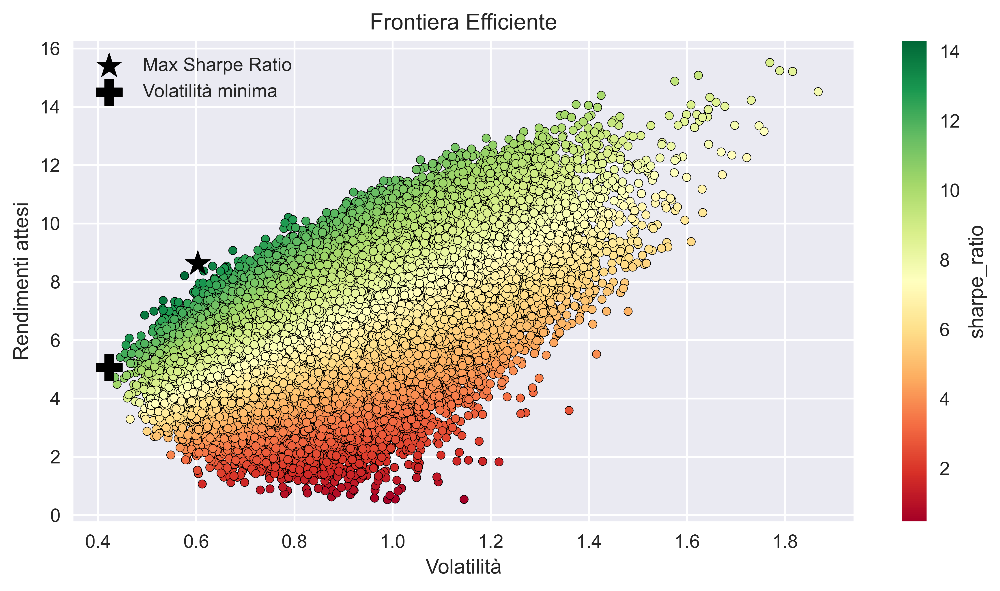

In [95]:
fig, ax = plt.subplots()
df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.scatter(x=max_sharpe_portf.volatility, 
           y=max_sharpe_portf.returns, 
           c='black', marker='*', 
           s=200, label='Max Sharpe Ratio')
ax.scatter(x=min_vol_portf.volatility, 
           y=min_vol_portf.returns, 
           c='black', marker='P', 
           s=200, label='Volatilità minima')
ax.set(xlabel='Volatilità', ylabel='Rendimenti attesi', 
       title='Frontiera Efficiente')
ax.legend()

plt.tight_layout()

plt.show()

Metodo analitico con i rendimenti attesi - funzione di ottimizzazione di Scipy

In [96]:
rtns_range = np.linspace(-0.22, 0.32, 200)

In [97]:
efficient_portfolios = get_efficient_frontier(avg_returns, 
                                              cov_mat, 
                                              rtns_range)

In [98]:
vols_range = [x['fun'] for x in efficient_portfolios]

In [99]:
# portafoglio con volatilità minima

min_vol_ind = np.argmin(vols_range)
min_vol_portf_rtn = rtns_range[min_vol_ind]
min_vol_portf_vol = efficient_portfolios[min_vol_ind]['fun']

min_vol_portf = {'Return': min_vol_portf_rtn,
                 'Volatility': min_vol_portf_vol,
                 'Sharpe Ratio': (min_vol_portf_rtn / 
                                  min_vol_portf_vol)}

In [100]:
print('Portafoglio a volatilità minima')
print('Performance')

for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)

print('\nWeights')
for x, y in zip(risky_assets, efficient_portfolios[min_vol_ind]['x']):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Portafoglio a volatilità minima
Performance
Return: 32.00% Volatility: 64.25% Sharpe Ratio: 49.81% 
Weights
TSLA: 0.00% TM: 48.81% TSM: 0.00% NVDA: 0.00% PFE: 51.19% JNJ: 0.00% 

In [101]:
# portafoglio con lo sharpe ratio più alto

# funzione obiettivo
def neg_sharpe_ratio(w, avg_rtns, cov_mat, rf_rate):
    portf_returns = np.sum(avg_rtns * w)
    portf_volatility = np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))
    portf_sharpe_ratio = (portf_returns - rf_rate) / portf_volatility
    return -portf_sharpe_ratio

In [102]:
# ricerca del portafoglio ottimale
n_assets = len(avg_returns)
RF_RATE = 0

args = (avg_returns, cov_mat, RF_RATE)
constraints = ({'type': 'eq', 
                'fun': lambda x: np.sum(x) - 1})
bounds = tuple((0,1) for asset in range(n_assets))
initial_guess = n_assets * [1. / n_assets]

max_sharpe_portf = sco.minimize(neg_sharpe_ratio, 
                                x0=initial_guess, 
                                args=args,
                                method='SLSQP', 
                                bounds=bounds, 
                                constraints=constraints)

In [103]:
max_sharpe_portf_w = max_sharpe_portf['x']
max_sharpe_scipy_ra_w = max_sharpe_portf_w
max_sharpe_portf = {'Return': get_portf_rtn(max_sharpe_portf_w, 
                                            avg_returns),
                    'Volatility': get_portf_vol(max_sharpe_portf_w, 
                                                avg_returns, 
                                                cov_mat),
                    'Sharpe Ratio': -max_sharpe_portf['fun']}

In [104]:
print('Portafoglio Max Sharpe ratio')
print('Performance')

for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)

print('\nWeights')
for x, y in zip(risky_assets, max_sharpe_portf_w):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Portafoglio Max Sharpe ratio
Performance
Return: 727.74% Volatility: 45.40% Sharpe Ratio: 1603.02% 
Weights
TSLA: 0.00% TM: 0.00% TSM: 12.94% NVDA: 70.20% PFE: 16.86% JNJ: 0.00% 

Calcolo del beta del portafoglio rispetto al mercato

In [105]:
# calcolo del beta del portafoglio ottimale ottenuto dal metodo di simulazione con i rendimenti passati
list_beta = []
for i in beta:
    list_beta.append(i)
round(np.average(list_beta, weights=max_sharpe_mc_rp_w), 4)

1.1646

In [106]:
# calcolo del beta del portafoglio ottimale ottenuto dal metodo analitico con i rendimenti passati
list_beta = []
for i in beta:
    list_beta.append(i)
round(np.average(list_beta, weights=max_sharpe_scipy_rp_w), 4)

1.1556

In [107]:
# calcolo del beta del portafoglio ottimale ottenuto dal metodo di simulazione con i rendimenti attesi
list_beta = []
for i in beta:
    list_beta.append(i)
round(np.average(list_beta, weights=max_sharpe_mc_ra_w), 4)

1.1982

In [108]:
# calcolo del beta del portafoglio ottimale ottenuto dal metodo analitico con i rendimenti attesi
list_beta = []
for i in beta:
    list_beta.append(i)
round(np.average(list_beta, weights=max_sharpe_scipy_ra_w), 4)

1.1864

Costruzione del portafoglio effettivo

In [109]:
# parametri
n_days = 252
risky_assets = ['TSLA', 'TM', 'TSM', 'NVDA', 'PFE', 'JNJ']
# download dei prezzi
df = web.DataReader(risky_assets, 'yahoo', '2011-11-30', '2020-11-30')['Adj Close'] 
# calcolo rendimenti
returns_df = df.pct_change()
avg_returns = returns_df.mean() * n_days
cov_mat = returns_df.cov() * n_days
rtnPortEff = 0
for asset in risky_assets:
    rtnPortEff += 0.16666*avg_returns[asset]
print("Rendimento portafoglio effettivo:",round(rtnPortEff*100, 2),"%")

Rendimento portafoglio effettivo: 30.18 %
